In [ ]:
!pip install numpy librosa torch torchaudio scipy soundfile pystoi matplotlib pystoi

In [ ]:
!pip install pesq

In [ ]:
!pip install demucs

# Part A : Analyze

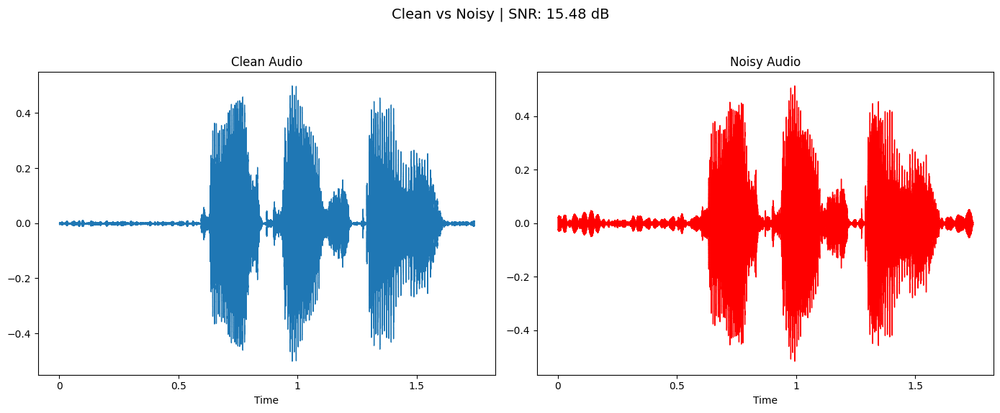

=== Clean vs Noisy Metrics ===
SNR: 15.48 dB
RMS: 0.0152
Peak: 0.0550
Crest: 3.6126
ZCR: 0.0093
Centroid: 1996.4626
Bandwidth: 3955.6030
Flatness: 0.0005
Kurtosis: 0.8385
Skewness: 0.0015


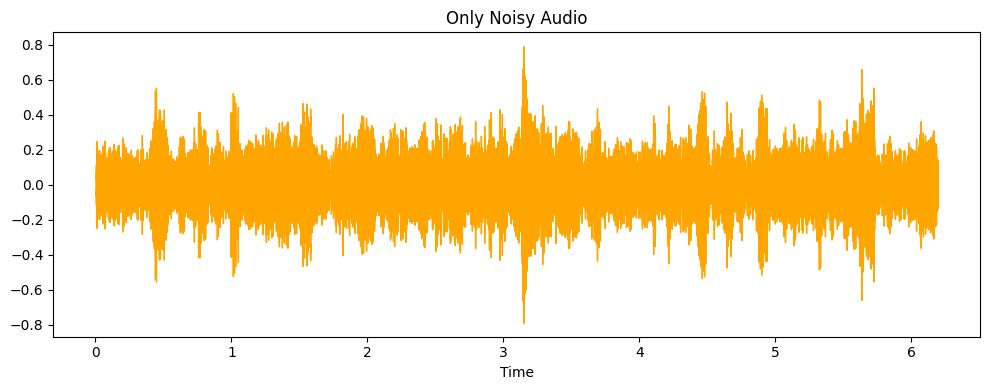


=== Only Noisy Metrics ===
RMS: 0.1035
Peak: 0.7906
Crest: 7.6350
ZCR: 0.1139
Centroid: 1734.3876
Bandwidth: 1801.6175
Flatness: 0.0299
Kurtosis: 0.8848
Skewness: 0.2136


In [10]:
import os
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from scipy.signal import welch
from scipy import stats
import glob

CLEAN_DIR = '/kaggle/input/speechmajorques2/set 1 - Clean and noisy-20250419T093119Z-001/set 1 - Clean and noisy/clean'
NOISY_DIR = '/kaggle/input/speechmajorques2/set 1 - Clean and noisy-20250419T093119Z-001/set 1 - Clean and noisy/noisy'
ONLY_NOISY_DIR = '/kaggle/input/speechmajorques2/set 2 - only noisy-20250419T093119Z-001/set 2 - only noisy'

os.makedirs('noise_analysis_results', exist_ok=True)

# === Metric Functions ===
def calculate_snr(clean, noisy):
    min_len = min(len(clean), len(noisy))
    clean, noisy = clean[:min_len], noisy[:min_len]
    noise = noisy - clean
    signal_power = np.sum(clean ** 2)
    noise_power = np.sum(noise ** 2)
    snr = 10 * np.log10(signal_power / noise_power) if noise_power > 0 else float('inf')
    return snr, noise

def extract_metrics(audio, sr):
    rms = np.sqrt(np.mean(np.square(audio)))
    peak = np.max(np.abs(audio))
    crest = peak / rms if rms > 0 else 0
    zcr = librosa.feature.zero_crossing_rate(audio)[0].mean()
    centroid = librosa.feature.spectral_centroid(y=audio, sr=sr)[0].mean()
    bandwidth = librosa.feature.spectral_bandwidth(y=audio, sr=sr)[0].mean()
    flatness = librosa.feature.spectral_flatness(y=audio)[0].mean()
    kurt = stats.kurtosis(audio)
    skew = stats.skew(audio)
    return {
        'RMS': rms, 'Peak': peak, 'Crest': crest,
        'ZCR': zcr, 'Centroid': centroid, 'Bandwidth': bandwidth,
        'Flatness': flatness, 'Kurtosis': kurt, 'Skewness': skew
    }

# === Visualize One Clean-Noisy Pair ===
def visualize_clean_noisy():
    clean_files = sorted(glob.glob(os.path.join(CLEAN_DIR, '*.wav')))
    clean_file = clean_files[0]
    parts = os.path.basename(clean_file).split('_')
    identifier = '_'.join(parts[-2:])
    noisy_file = os.path.join(NOISY_DIR, f"Datasets_noisy_testset_wav_{identifier}")
    
    clean, sr = librosa.load(clean_file, sr=None)
    noisy, _ = librosa.load(noisy_file, sr=sr)
    
    snr, noise = calculate_snr(clean, noisy)
    metrics = extract_metrics(noise, sr)

    # Plot side-by-side
    plt.figure(figsize=(14, 6))
    plt.suptitle(f"Clean vs Noisy | SNR: {snr:.2f} dB", fontsize=14)

    plt.subplot(1, 2, 1)
    librosa.display.waveshow(clean, sr=sr)
    plt.title("Clean Audio")

    plt.subplot(1, 2, 2)
    librosa.display.waveshow(noisy, sr=sr, color='r')
    plt.title("Noisy Audio")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    plt.savefig("noise_analysis_results/clean_vs_noisy.png")
    plt.close()

    print("=== Clean vs Noisy Metrics ===")
    print(f"SNR: {snr:.2f} dB")
    for k, v in metrics.items():
        print(f"{k}: {v:.4f}")

# === Visualize One Only-Noisy File ===
def visualize_only_noisy():
    files = sorted(glob.glob(os.path.join(ONLY_NOISY_DIR, '*.wav')))
    file = files[0]
    audio, sr = librosa.load(file, sr=None)
    metrics = extract_metrics(audio, sr)

    plt.figure(figsize=(10, 4))
    plt.title("Only Noisy Audio")
    librosa.display.waveshow(audio, sr=sr, color='orange')
    plt.tight_layout()
    plt.show()
    plt.savefig("noise_analysis_results/only_noisy.png")
    plt.close()

    print("\n=== Only Noisy Metrics ===")
    for k, v in metrics.items():
        print(f"{k}: {v:.4f}")

# === Run
visualize_clean_noisy()
visualize_only_noisy()


Using device: cuda
Loading base model...
Loading pre-trained model from best_demucs_denoiser.pth
Loaded model from epoch 5

Running inference on paired test data...
Found 8 matched pairs for testing
Processing test pair: Datasets_clean_testset_wav_p232_001.wav - Datasets_noisy_testset_wav_p232_001.wav


/tmp/ipykernel_31/227371321.py:536: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=device)
/tmp/ipykernel_31/227371321.py:285

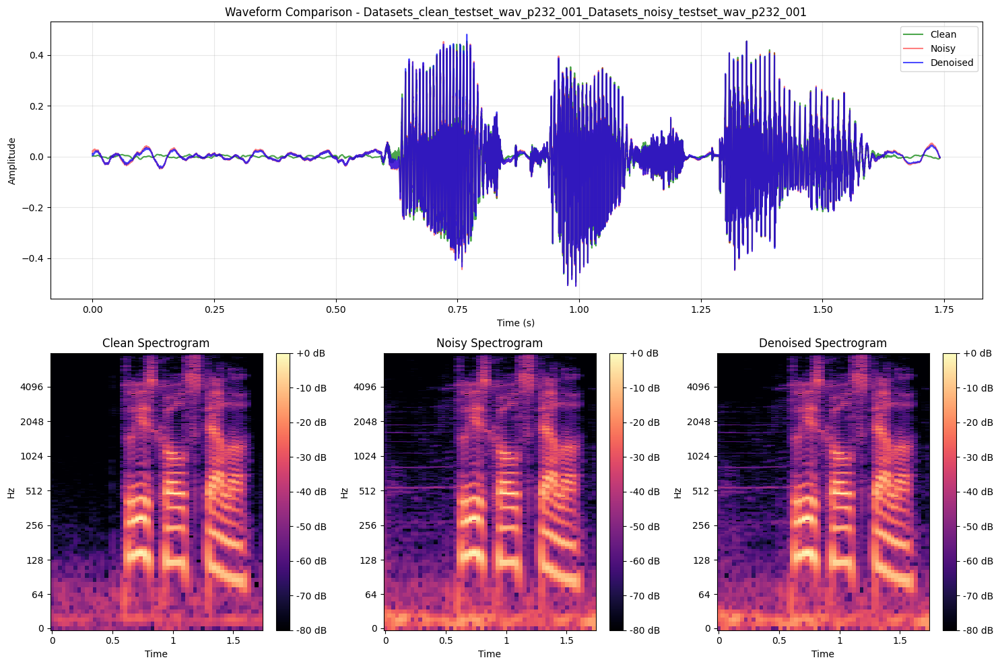

Metrics for Datasets_clean_testset_wav_p232_001_Datasets_noisy_testset_wav_p232_001:
pesq: 2.8937
stoi: 0.9023
snr: 16.5099
sdr: 16.5099

Processing test pair: Datasets_clean_testset_wav_p232_002.wav - Datasets_noisy_testset_wav_p232_002.wav


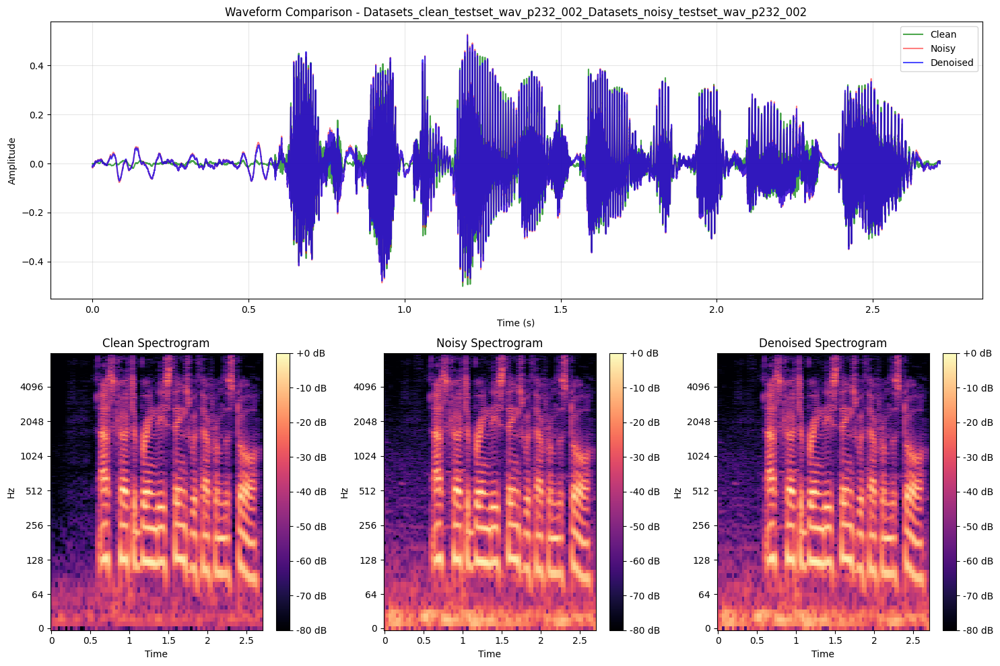

Metrics for Datasets_clean_testset_wav_p232_002_Datasets_noisy_testset_wav_p232_002:
pesq: 3.0461
stoi: 0.9679
snr: 12.0343
sdr: 12.0343

Processing test pair: Datasets_clean_testset_wav_p232_003.wav - Datasets_noisy_testset_wav_p232_003.wav


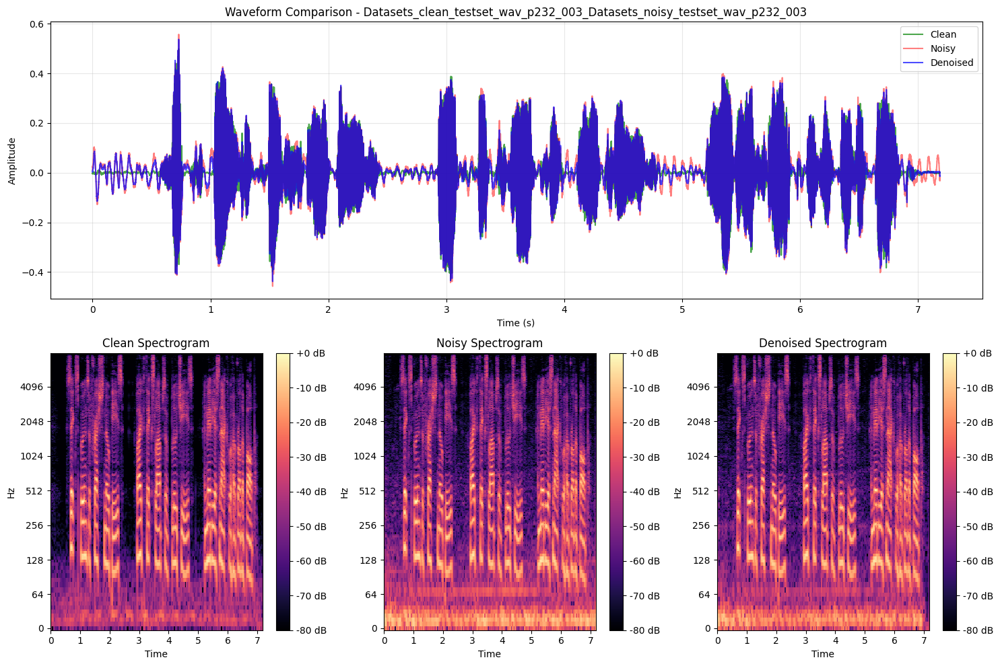

Metrics for Datasets_clean_testset_wav_p232_003_Datasets_noisy_testset_wav_p232_003:
pesq: 2.7605
stoi: 0.9729
snr: 9.8504
sdr: 9.8504

Processing test pair: Datasets_clean_testset_wav_p232_005.wav - Datasets_noisy_testset_wav_p232_005.wav


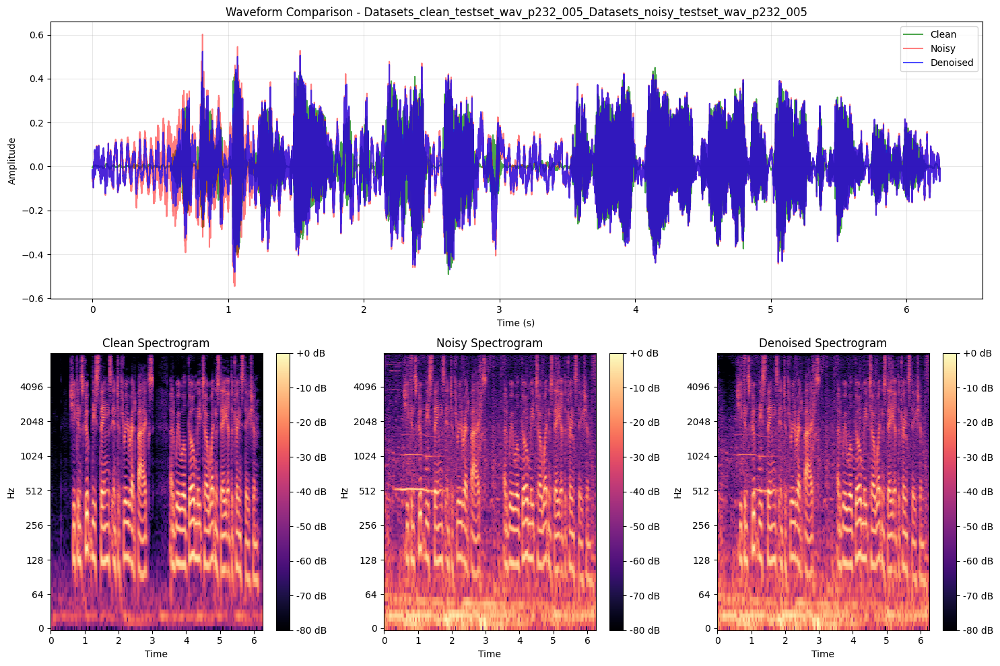

Metrics for Datasets_clean_testset_wav_p232_005_Datasets_noisy_testset_wav_p232_005:
pesq: 1.3370
stoi: 0.8805
snr: 3.0709
sdr: 3.0709

Processing test pair: Datasets_clean_testset_wav_p232_006.wav - Datasets_noisy_testset_wav_p232_006.wav


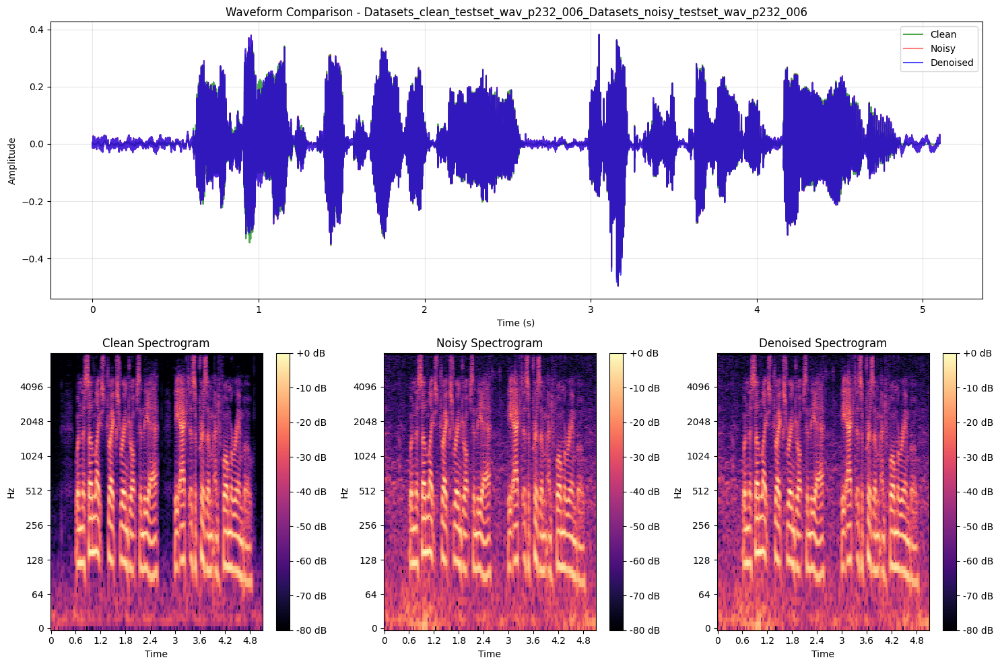

Metrics for Datasets_clean_testset_wav_p232_006_Datasets_noisy_testset_wav_p232_006:
pesq: 2.2061
stoi: 0.9651
snr: 16.9093
sdr: 16.9093

Processing test pair: Datasets_clean_testset_wav_p232_007.wav - Datasets_noisy_testset_wav_p232_007.wav


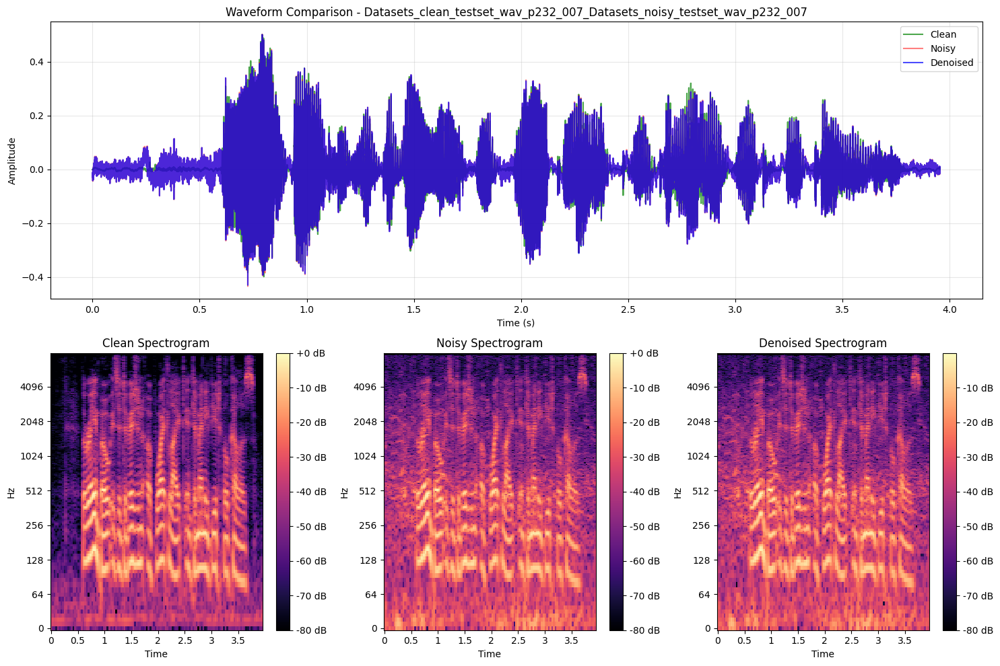

Metrics for Datasets_clean_testset_wav_p232_007_Datasets_noisy_testset_wav_p232_007:
pesq: 1.5550
stoi: 0.9370
snr: 11.9146
sdr: 11.9146

Processing test pair: Datasets_clean_testset_wav_p232_009.wav - Datasets_noisy_testset_wav_p232_009.wav


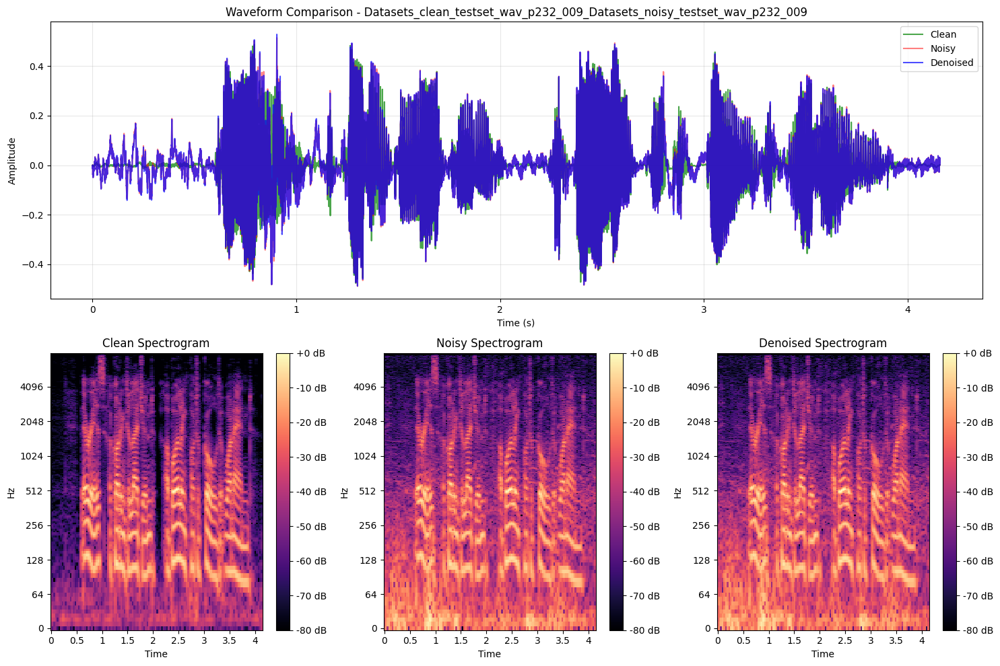

Metrics for Datasets_clean_testset_wav_p232_009_Datasets_noisy_testset_wav_p232_009:
pesq: 1.7929
stoi: 0.9608
snr: 6.9395
sdr: 6.9395

Processing test pair: Datasets_clean_testset_wav_p232_010.wav - Datasets_noisy_testset_wav_p232_010.wav


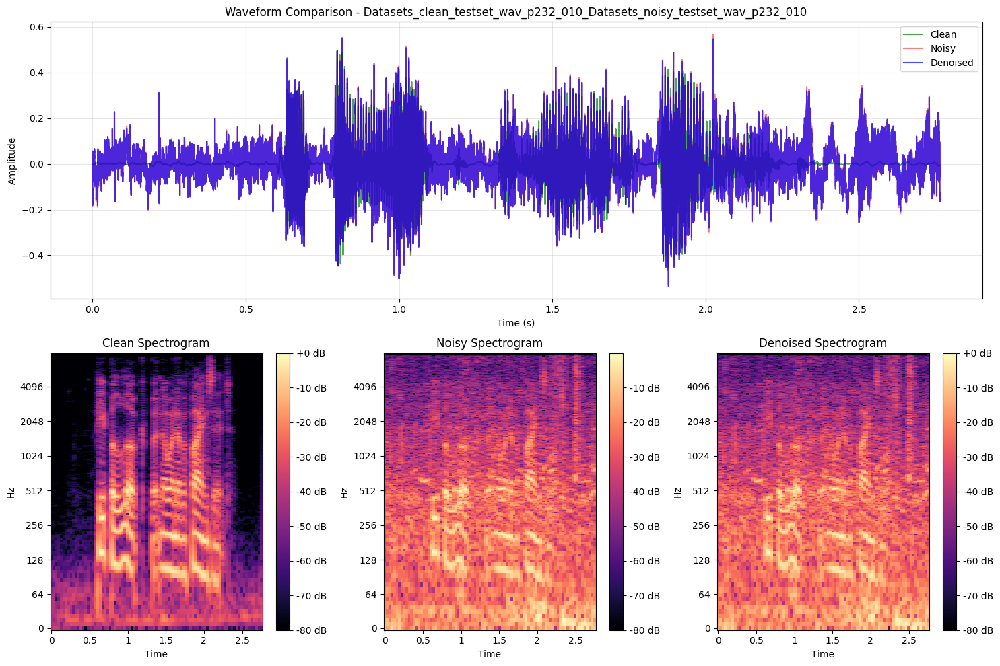

Metrics for Datasets_clean_testset_wav_p232_010_Datasets_noisy_testset_wav_p232_010:
pesq: 1.2069
stoi: 0.7855
snr: 1.0648
sdr: 1.0648


Average Metrics Across All Test Files:
pesq: 2.0998
stoi: 0.9215
snr: 9.7867
sdr: 9.7867

Running inference on unpaired noisy data...
Processing file 1/4: ped.wav


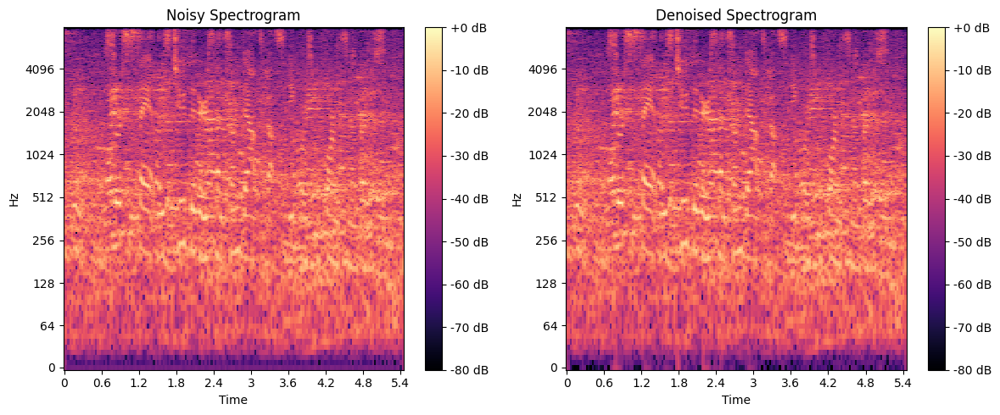

Processing file 2/4: street.wav


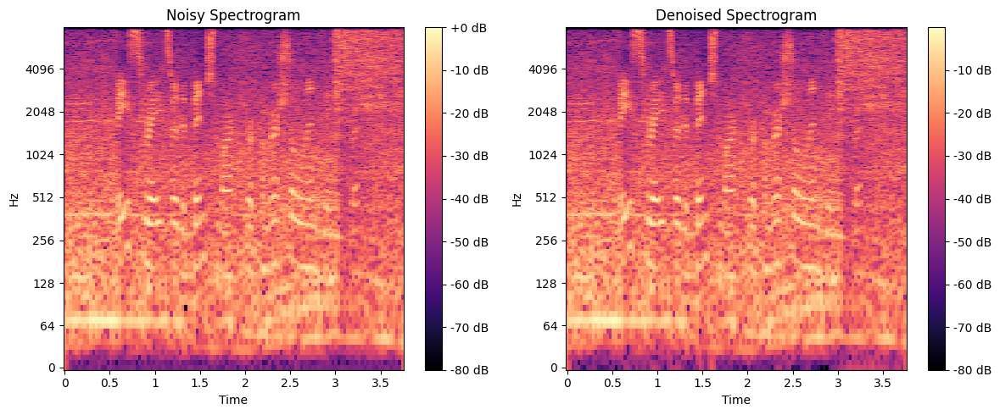

Processing file 3/4: cafe.wav


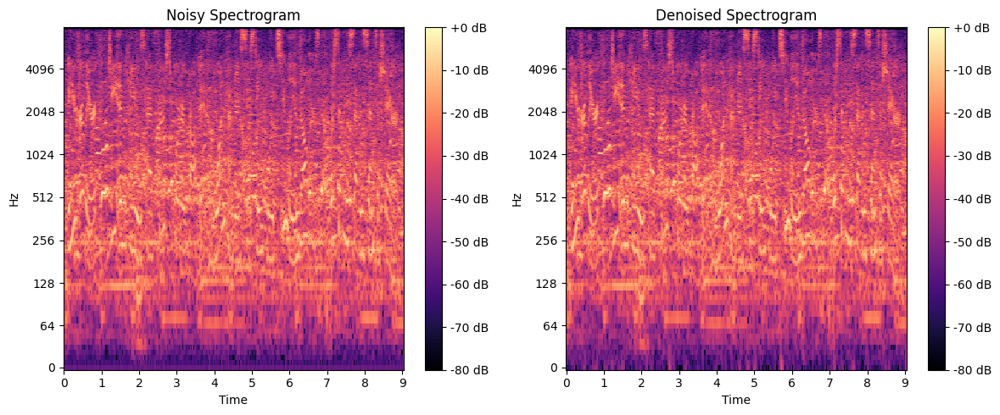

Processing file 4/4: bus.wav


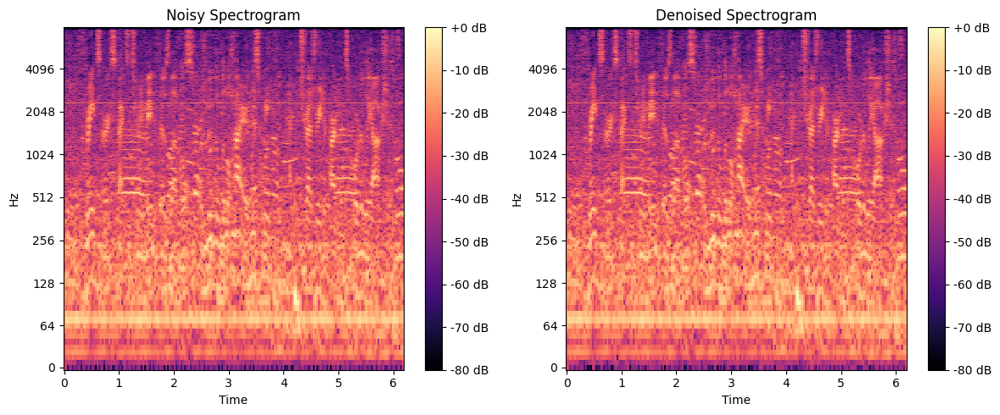

In [12]:
import os
import re
import random
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchaudio
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import matplotlib.pyplot as plt
import librosa
import librosa.display
import soundfile as sf
from pesq import pesq
from pystoi import stoi
from demucs.pretrained import get_model
from demucs.apply import apply_model

class DemucsDataset(Dataset):
    def __init__(self, clean_paths, noisy_paths, sr=16000, segment_length=4, augment=True):
        self.clean_paths = clean_paths
        self.noisy_paths = noisy_paths
        self.sr = sr
        self.segment_samples = int(segment_length * sr)
        self.augment = augment
        
    def __len__(self):
        return len(self.clean_paths)
    
    def _load_audio(self, path):
        if isinstance(path, list):
            path = random.choice(path)
            
        wav, orig_sr = torchaudio.load(path)
        
        if orig_sr != self.sr:
            resampler = torchaudio.transforms.Resample(orig_sr, self.sr)
            wav = resampler(wav)
        
        if wav.shape[0] == 1:
            wav = torch.cat([wav, wav], dim=0)
            
        return wav
    
    def __getitem__(self, idx):
        clean = self._load_audio(self.clean_paths[idx])
        noisy = self._load_audio(self.noisy_paths[idx])
        
        min_len = min(clean.shape[1], noisy.shape[1])
        clean = clean[:, :min_len]
        noisy = noisy[:, :min_len]
        
        if clean.shape[1] > self.segment_samples:
            start = torch.randint(0, clean.shape[1] - self.segment_samples, (1,)).item()
            clean = clean[:, start:start + self.segment_samples]
            noisy = noisy[:, start:start + self.segment_samples]
        else:
            pad = self.segment_samples - clean.shape[1]
            clean = F.pad(clean, (0, pad))
            noisy = F.pad(noisy, (0, pad))
        
        if self.augment:
            gain = torch.rand(1).item() * 6 - 3
            clean = clean * (10 ** (gain / 20))
            noisy = noisy * (10 ** (gain / 20))
            
            if torch.rand(1).item() > 0.5:
                clean = -clean
                noisy = -noisy
        
        clean = clean / (clean.abs().max() + 1e-7)
        noisy = noisy / (noisy.abs().max() + 1e-7)
        
        sources = torch.zeros(4, 2, clean.shape[1])
        sources[3] = clean
        
        return noisy, sources

class DemucsLoss(nn.Module):
    def __init__(self, alpha=0.5):
        super().__init__()
        self.alpha = alpha
        
    def forward(self, outputs, targets):
        outputs = outputs.requires_grad_(True)
        pred_vocals = outputs[:, 3].mean(dim=1)
        target_vocals = targets[:, 3].mean(dim=1)
        
        l1_loss = F.l1_loss(pred_vocals, target_vocals)
        
        sc_loss, mag_loss = 0, 0
        for n_fft in [512, 1024, 2048]:
            window = torch.hann_window(n_fft, device=outputs.device)
            
            stft_pred = torch.stft(
                pred_vocals, 
                n_fft, 
                hop_length=n_fft//4, 
                window=window,
                return_complex=True
            )
            stft_target = torch.stft(
                target_vocals, 
                n_fft, 
                hop_length=n_fft//4, 
                window=window,
                return_complex=True
            )
            
            sc_loss += F.l1_loss(stft_pred, stft_target)
            mag_loss += F.l1_loss(torch.abs(stft_pred), torch.abs(stft_target))
        
        return (1 - self.alpha) * l1_loss + self.alpha * (sc_loss + mag_loss) / 3

def freeze_layers_demucs(model, only_finetune="last"):
    total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    
    for param in model.parameters():
        param.requires_grad = False
    
    has_encoder = hasattr(model, 'encoder')
    has_decoder = hasattr(model, 'decoder')
    has_lstm = hasattr(model, 'lstm')
    
    if only_finetune == "none":
        pass
    
    elif only_finetune == "last" and has_lstm:
        if has_lstm:
            for param in model.lstm.parameters():
                param.requires_grad = True
        if has_decoder:
            for param in model.decoder.parameters():
                param.requires_grad = True
    
    elif only_finetune == "decoder" and has_decoder:
        for param in model.decoder.parameters():
            param.requires_grad = True
    
    elif only_finetune == "encoder_last" and has_encoder:
        encoder_children = list(model.encoder.named_children())
        if encoder_children:
            name, last_module = encoder_children[-1]
            for param in last_module.parameters():
                param.requires_grad = True
                
        if has_lstm:
            for param in model.lstm.parameters():
                param.requires_grad = True
    
    elif only_finetune == "decoder_last" and has_decoder:
        decoder_children = list(model.decoder.named_children())
        if decoder_children:
            name, last_module = decoder_children[-1]
            for param in last_module.parameters():
                param.requires_grad = True
    
    else:
        for param in model.parameters():
            param.requires_grad = True
    
    if hasattr(model, 'output'):
        for param in model.output.parameters():
            param.requires_grad = True
    
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"Trainable parameters after selective freezing: {trainable_params:,}")
    
    return model

def train_demucs(model, train_loader, val_loader, epochs=30, lr=1e-4):
    model.train()
    device = next(model.parameters()).device
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = DemucsLoss(alpha=0.7)
    
    best_val_loss = float('inf')
    history = {'train_loss': [], 'val_loss': []}
    
    for epoch in range(epochs):
        model.train()
        train_loss = 0
        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")
        
        for noisy, clean in pbar:
            noisy, clean = noisy.to(device), clean.to(device)
            
            optimizer.zero_grad()
            
            with torch.set_grad_enabled(True):
                outputs = apply_model(model, noisy, split=True, overlap=0.25)
                min_len = min(outputs.shape[-1], clean.shape[-1])
                outputs = outputs[..., :min_len]
                clean = clean[..., :min_len]
                loss = criterion(outputs, clean)
            
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            pbar.set_postfix({'loss': loss.item()})
        
        avg_train_loss = train_loss / len(train_loader)
        history['train_loss'].append(avg_train_loss)
        
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for noisy, clean in val_loader:
                noisy, clean = noisy.to(device), clean.to(device)
                outputs = apply_model(model, noisy, split=True, overlap=0.25)
                min_len = min(outputs.shape[-1], clean.shape[-1])
                outputs = outputs[..., :min_len]
                clean = clean[..., :min_len]
                val_loss += criterion(outputs, clean).item()
        
        avg_val_loss = val_loss / len(val_loader)
        history['val_loss'].append(avg_val_loss)
        
        print(f"Epoch {epoch+1} - Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
        
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': avg_val_loss,
            }, 'best_demucs_denoiser.pth')
            print("Saved best model")
    
    return model, history

def calculate_metrics(clean, denoised, sr=16000):
    metrics = {}
    
    try:
        metrics['pesq'] = pesq(sr, clean, denoised, 'wb')
    except:
        metrics['pesq'] = float('nan')
    
    try:
        metrics['stoi'] = stoi(clean, denoised, sr, extended=False)
    except:
        metrics['stoi'] = float('nan')
    
    noise = denoised - clean
    signal_power = np.sum(clean**2) + 1e-10
    noise_power = np.sum(noise**2) + 1e-10
    metrics['snr'] = 10 * np.log10(signal_power / noise_power)
    
    try:
        ratio = np.sum(clean**2) / (np.sum((clean - denoised)**2) + 1e-10)
        metrics['sdr'] = 10 * np.log10(ratio)
    except:
        metrics['sdr'] = float('nan')
    
    return metrics

def visualize_results(clean, noisy, denoised, metrics, filename, output_dir):
    plt.figure(figsize=(15, 10))
    
    # Waveform plot
    plt.subplot(2, 1, 1)
    t = np.arange(len(clean)) / 16000
    plt.plot(t, clean, 'g-', alpha=0.7, label='Clean')
    plt.plot(t, noisy, 'r-', alpha=0.5, label='Noisy')
    plt.plot(t, denoised, 'b-', alpha=0.7, label='Denoised')
    plt.title(f'Waveform Comparison - {filename}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Spectrogram plot
    plt.subplot(2, 1, 2)
    D_clean = librosa.amplitude_to_db(np.abs(librosa.stft(clean)), ref=np.max)
    D_noisy = librosa.amplitude_to_db(np.abs(librosa.stft(noisy)), ref=np.max)
    D_denoised = librosa.amplitude_to_db(np.abs(librosa.stft(denoised)), ref=np.max)
    
    # Plot spectrograms side by side
    plt.subplot(2, 3, 4)
    librosa.display.specshow(D_clean, y_axis='log', x_axis='time', sr=16000)
    plt.title('Clean Spectrogram')
    plt.colorbar(format='%+2.0f dB')
    
    plt.subplot(2, 3, 5)
    librosa.display.specshow(D_noisy, y_axis='log', x_axis='time', sr=16000)
    plt.title('Noisy Spectrogram')
    plt.colorbar(format='%+2.0f dB')
    
    plt.subplot(2, 3, 6)
    librosa.display.specshow(D_denoised, y_axis='log', x_axis='time', sr=16000)
    plt.title('Denoised Spectrogram')
    plt.colorbar(format='%+2.0f dB')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"results_{filename}.png"), dpi=300)
    plt.show()
    
    # Display metrics
    metrics_str = "\n".join([f"{k}: {v:.4f}" for k, v in metrics.items()])
    print(f"Metrics for {filename}:\n{metrics_str}\n")

def find_matching_train_files(clean_dir, noisy_dir):
    clean_files = sorted([f for f in os.listdir(clean_dir) if f.endswith(('.wav', '.flac'))])
    noisy_files = sorted([f for f in os.listdir(noisy_dir) if f.endswith(('.wav', '.flac'))])
    
    matched_pairs = []
    
    for clean_file in clean_files:
        clean_stem = os.path.splitext(clean_file)[0]
        
        matching_noisy = []
        for noisy_file in noisy_files:
            noisy_stem = os.path.splitext(noisy_file)[0]
            
            if noisy_stem.startswith(clean_stem + "_") or noisy_stem == clean_stem:
                matching_noisy.append(noisy_file)
        
        if matching_noisy:
            for noisy_file in matching_noisy:
                matched_pairs.append((clean_file, noisy_file))
        else:
            print(f"Warning: No matching noisy file found for {clean_file}")
    
    return matched_pairs

def find_matching_test_files(clean_dir, noisy_dir):
    clean_files = sorted([f for f in os.listdir(clean_dir) if f.endswith(('.wav', '.flac'))])
    noisy_files = sorted([f for f in os.listdir(noisy_dir) if f.endswith(('.wav', '.flac'))])
    
    matched_pairs = []
    
    for clean_file in clean_files:
        match = re.search(r'p\d+_\d+', clean_file)
        if match:
            identifier = match.group(0)
            
            for noisy_file in noisy_files:
                if identifier in noisy_file:
                    matched_pairs.append((clean_file, noisy_file))
                    break
        else:
            possible_noisy = clean_file.replace('clean', 'noisy')
            if possible_noisy in noisy_files:
                matched_pairs.append((clean_file, possible_noisy))
            else:
                print(f"Warning: No matching noisy file found for {clean_file}")
    
    return matched_pairs

def setup_train_dataset(clean_dir, noisy_dir, sr=16000, segment_length=4, val_ratio=0.2):
    matched_pairs = find_matching_train_files(clean_dir, noisy_dir)
    
    if not matched_pairs:
        print("Warning: No matching files found between clean and noisy directories.")
        return None, None, None, None
    
    clean_files = [os.path.join(clean_dir, cf) for cf, _ in matched_pairs]
    noisy_files = [os.path.join(noisy_dir, nf) for _, nf in matched_pairs]
    
    clean_to_noisy = {}
    for clean_path, noisy_path in zip(clean_files, noisy_files):
        if clean_path not in clean_to_noisy:
            clean_to_noisy[clean_path] = []
        clean_to_noisy[clean_path].append(noisy_path)
    
    unique_clean_files = list(clean_to_noisy.keys())
    grouped_noisy_files = list(clean_to_noisy.values())
    
    train_clean, val_clean, train_noisy, val_noisy = train_test_split(
        unique_clean_files, grouped_noisy_files, test_size=val_ratio, random_state=42
    )
    
    train_dataset = DemucsDataset(train_clean, train_noisy, sr=sr, segment_length=segment_length, augment=True)
    val_dataset = DemucsDataset(val_clean, val_noisy, sr=sr, segment_length=segment_length, augment=False)
    
    train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)
    
    print(f"Created datasets with {len(train_dataset)} training and {len(val_dataset)} validation samples")
    
    return train_dataset, val_dataset, train_loader, val_loader

def process_test_files(model, clean_dir, noisy_dir, output_dir="denoised_results"):
    os.makedirs(output_dir, exist_ok=True)
    device = next(model.parameters()).device
    
    matched_pairs = find_matching_test_files(clean_dir, noisy_dir)
    print(f"Found {len(matched_pairs)} matched pairs for testing")
    
    all_metrics = []
    
    for clean_file, noisy_file in matched_pairs:
        clean_path = os.path.join(clean_dir, clean_file)
        noisy_path = os.path.join(noisy_dir, noisy_file)
        
        print(f"Processing test pair: {clean_file} - {noisy_file}")
        
        # Load audio files
        clean, sr = librosa.load(clean_path, sr=16000)
        noisy, _ = librosa.load(noisy_path, sr=16000)
        
        # Convert noisy to tensor for Demucs
        noisy_tensor = torch.from_numpy(noisy).float()
        if noisy_tensor.dim() == 1:
            noisy_tensor = noisy_tensor.unsqueeze(0)
            noisy_tensor = torch.cat([noisy_tensor, noisy_tensor], dim=0)
        
        noisy_tensor = noisy_tensor.unsqueeze(0).to(device)
        
        # Apply Demucs model
        model.eval()
        with torch.no_grad():
            sources = apply_model(model, noisy_tensor, split=True, overlap=0.25)
            denoised = sources[0, 3].mean(dim=0).cpu().numpy()  # vocals/clean speech
        
        # Make sure all audios have the same length for comparison
        min_len = min(len(clean), len(noisy), len(denoised))
        clean = clean[:min_len]
        noisy = noisy[:min_len]
        denoised = denoised[:min_len]
        
        # Calculate metrics
        metrics = calculate_metrics(clean, denoised, sr)
        
        # Store metrics
        file_metrics = {
            'clean_file': clean_file,
            'noisy_file': noisy_file,
            'metrics': metrics
        }
        all_metrics.append(file_metrics)
        
        # Save denoised audio
        sf.write(os.path.join(output_dir, f"denoised_{noisy_file}"), denoised, sr)
        
        # Visualize results
        visualize_results(clean, noisy, denoised, metrics, 
                         f"{os.path.splitext(clean_file)[0]}_{os.path.splitext(noisy_file)[0]}", 
                         output_dir)
    
    # Calculate and print average metrics
    avg_metrics = {}
    for metric in ['pesq', 'stoi', 'snr', 'sdr']:
        values = [m['metrics'][metric] for m in all_metrics if not np.isnan(m['metrics'][metric])]
        if values:
            avg_metrics[metric] = np.mean(values)
        else:
            avg_metrics[metric] = float('nan')
    
    print("\nAverage Metrics Across All Test Files:")
    for metric, value in avg_metrics.items():
        print(f"{metric}: {value:.4f}")
    
    return all_metrics

def process_only_noisy_files(model, noisy_dir, output_dir="denoised_noisy_only"):
    os.makedirs(output_dir, exist_ok=True)
    device = next(model.parameters()).device
    
    noisy_files = [f for f in os.listdir(noisy_dir) if f.endswith(('.wav', '.flac'))]
    
    for i, noisy_file in enumerate(noisy_files):
        print(f"Processing file {i+1}/{len(noisy_files)}: {noisy_file}")
        noisy_path = os.path.join(noisy_dir, noisy_file)
        
        # Load noisy audio
        noisy, sr = librosa.load(noisy_path, sr=16000)
        
        # Convert to tensor
        noisy_tensor = torch.from_numpy(noisy).float()
        if noisy_tensor.dim() == 1:
            noisy_tensor = noisy_tensor.unsqueeze(0)
            noisy_tensor = torch.cat([noisy_tensor, noisy_tensor], dim=0)
        
        noisy_tensor = noisy_tensor.unsqueeze(0).to(device)
        
        # Denoise with model
        model.eval()
        with torch.no_grad():
            sources = apply_model(model, noisy_tensor, split=True, overlap=0.25)
            denoised = sources[0, 3].mean(dim=0).cpu().numpy()
        
        # Save denoised audio
        output_path = os.path.join(output_dir, f"denoised_{noisy_file}")
        sf.write(output_path, denoised, sr)
        
        # Visualize spectrograms
        plt.figure(figsize=(12, 5))
        
        plt.subplot(1, 2, 1)
        D_noisy = librosa.amplitude_to_db(np.abs(librosa.stft(noisy)), ref=np.max)
        librosa.display.specshow(D_noisy, y_axis='log', x_axis='time', sr=sr)
        plt.title('Noisy Spectrogram')
        plt.colorbar(format='%+2.0f dB')
        
        plt.subplot(1, 2, 2)
        D_denoised = librosa.amplitude_to_db(np.abs(librosa.stft(denoised)), ref=np.max)
        librosa.display.specshow(D_denoised, y_axis='log', x_axis='time', sr=sr)
        plt.title('Denoised Spectrogram')
        plt.colorbar(format='%+2.0f dB')
        
        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, f"spectrogram_{noisy_file}.png"), dpi=300)
        plt.show()

def main():
    clean_train_dir = "/kaggle/input/speechmajorques2/Train_audio_org/Train_audio_org/working"
    noisy_train_dir = "/kaggle/input/speechmajorques2/Noisy_Audio/Noisy_Audio"
    
    clean_test_dir = "/kaggle/input/speechmajorques2/set 1 - Clean and noisy-20250419T093119Z-001/set 1 - Clean and noisy/clean"
    noisy_test_dir = "/kaggle/input/speechmajorques2/set 1 - Clean and noisy-20250419T093119Z-001/set 1 - Clean and noisy/noisy"
    only_noisy_test_dir = "/kaggle/input/speechmajorques2/set 2 - only noisy-20250419T093119Z-001/set 2 - only noisy"
    
    output_dir = "demucs_denoised_outputs"
    os.makedirs(output_dir, exist_ok=True)
    
    # Set up device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    # Load the model
    print("Loading base model...")
    model = get_model('htdemucs').to(device)
    
    # Check if pre-trained model exists
    model_path = 'best_demucs_denoiser.pth'
    if os.path.exists(model_path):
        print(f"Loading pre-trained model from {model_path}")
        checkpoint = torch.load(model_path, map_location=device)
        
        if 'model_state_dict' in checkpoint:
            model.load_state_dict(checkpoint['model_state_dict'], strict=False)
            print(f"Loaded model from epoch {checkpoint.get('epoch', 'unknown')}")
        
        print("\nRunning inference on paired test data...")
        paired_metrics = process_test_files(model, clean_test_dir, noisy_test_dir, 
                                         os.path.join(output_dir, "paired_test"))
        
        print("\nRunning inference on unpaired noisy data...")
        process_only_noisy_files(model, only_noisy_test_dir, 
                              os.path.join(output_dir, "unpaired_test"))
    else:
        # Create datasets and dataloaders for training
        print("Setting up datasets for training...")
        train_dataset, val_dataset, train_loader, val_loader = setup_train_dataset(
            clean_train_dir, noisy_train_dir, sr=16000, segment_length=4
        )
        
        if not train_loader or not val_loader:
            print("Error: Could not create datasets. Check your directories.")
            return
        
        # Freeze layers for fine-tuning
        model = freeze_layers_demucs(model, only_finetune="last")
        
        # Train the model
        print("Starting training...")
        model, history = train_demucs(model, train_loader, val_loader, epochs=10, lr=1e-4)
        
        # Plot training history
        plt.figure(figsize=(10, 5))
        plt.plot(history['train_loss'], label='Train Loss')
        plt.plot(history['val_loss'], label='Validation Loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.savefig(os.path.join(output_dir, 'training_history.png'), dpi=300)
        plt.show()
        
        # Evaluate on test data
        print("\nEvaluating on paired test data...")
        paired_metrics = process_test_files(model, clean_test_dir, noisy_test_dir, 
                                         os.path.join(output_dir, "paired_test"))
        
        print("\nProcessing unpaired noisy data...")
        process_only_noisy_files(model, only_noisy_test_dir, 
                              os.path.join(output_dir, "unpaired_test"))
        
        # Save the final model
        torch.save({
            'model_state_dict': model.state_dict(),
        }, os.path.join(output_dir, 'final_demucs_denoiser.pth'))
        
        print("Done! Final model saved to", os.path.join(output_dir, 'final_demucs_denoiser.pth'))

if __name__ == "__main__":
    main()

# Part C : Speech to Text

In [ ]:
!pip install jiwer


--- Running Paired Evaluation (Set 1) ---


/usr/local/lib/python3.11/dist-packages/whisper/__init__.py:150: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(fp, map_location=device)


Loaded Whisper model: base
Found 8 matching file pairs


Evaluating files:   0%|          | 0/8 [00:00<?, ?it/s]


Evaluating file: Datasets_noisy_testset_wav_p232_007.wav
--------------------------------------------------

Denoised Audio Metrics:
PESQ      : 1.5550
STOI      : 0.9370
SNR       : 11.9145
SDR       : 11.9145

Noisy Audio Metrics:
PESQ      : 1.5550
STOI      : 0.9370
SNR       : 11.9145
SDR       : 11.9145

Improvement Metrics:
PESQ Improvement    : +0.0000
STOI Improvement    : +0.0000
SNR Improvement     : +0.0000
SDR Improvement     : +0.0000


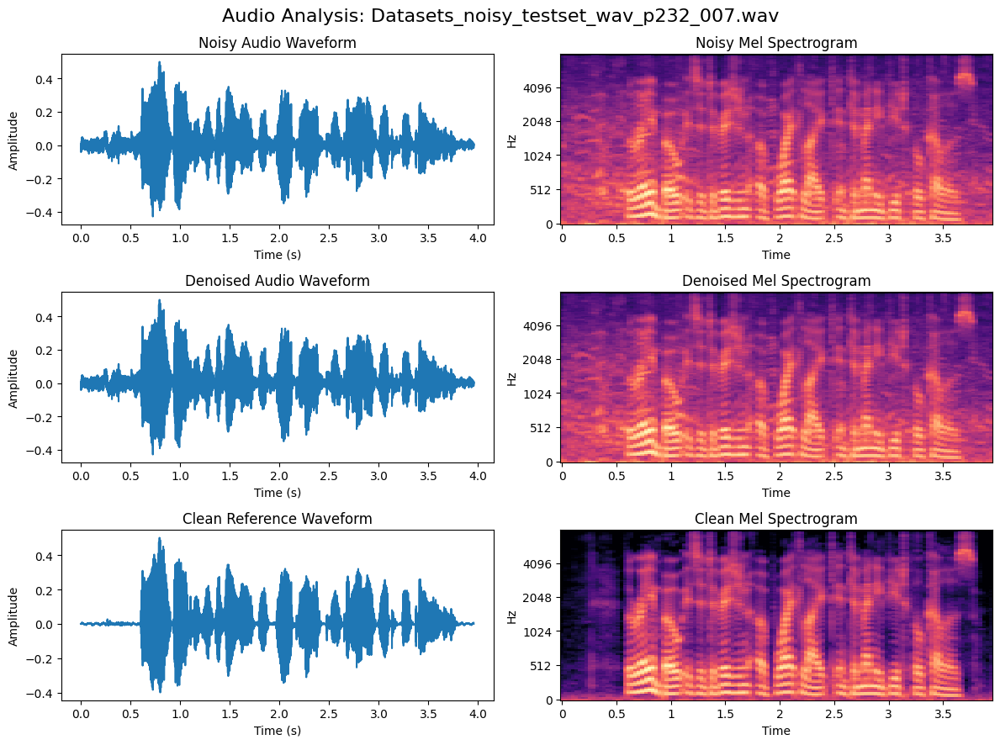

Evaluating files:  12%|█▎        | 1/8 [00:01<00:12,  1.76s/it]


Evaluating file: Datasets_noisy_testset_wav_p232_006.wav
--------------------------------------------------

Denoised Audio Metrics:
PESQ      : 2.2061
STOI      : 0.9651
SNR       : 16.9091
SDR       : 16.9091

Noisy Audio Metrics:
PESQ      : 2.2061
STOI      : 0.9651
SNR       : 16.9091
SDR       : 16.9091

Improvement Metrics:
PESQ Improvement    : +0.0000
STOI Improvement    : +0.0000
SNR Improvement     : +0.0000
SDR Improvement     : +0.0000


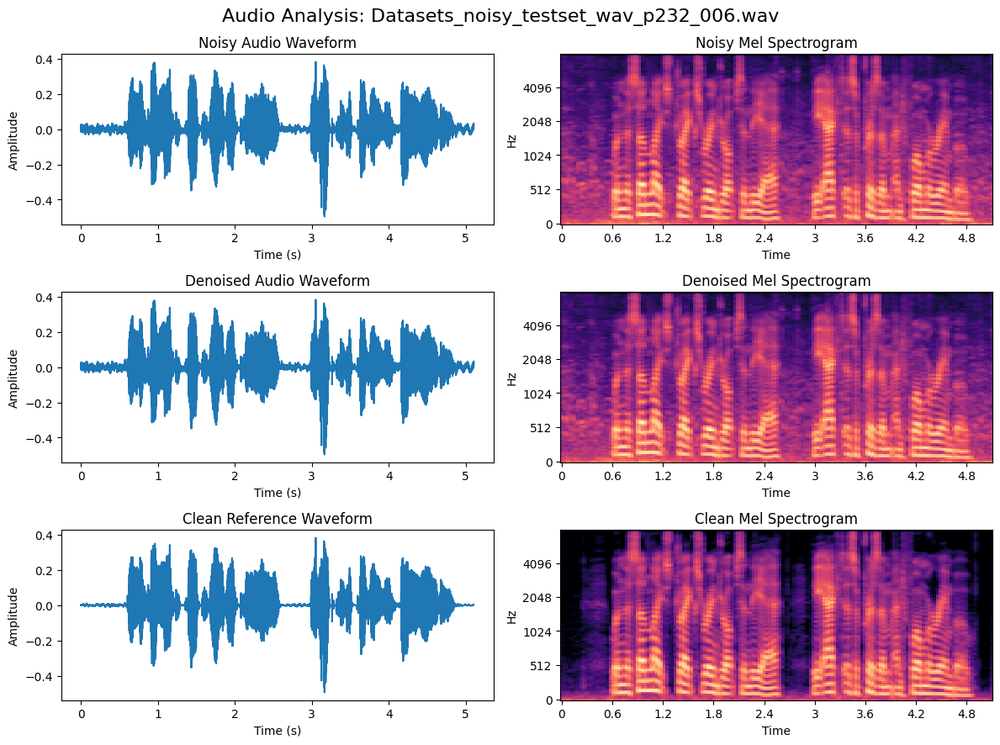

Evaluating files:  25%|██▌       | 2/8 [00:04<00:12,  2.08s/it]


Evaluating file: Datasets_noisy_testset_wav_p232_009.wav
--------------------------------------------------

Denoised Audio Metrics:
PESQ      : 1.7929
STOI      : 0.9608
SNR       : 6.9395
SDR       : 6.9395

Noisy Audio Metrics:
PESQ      : 1.7929
STOI      : 0.9608
SNR       : 6.9395
SDR       : 6.9395

Improvement Metrics:
PESQ Improvement    : +0.0000
STOI Improvement    : +0.0000
SNR Improvement     : +0.0000
SDR Improvement     : +0.0000


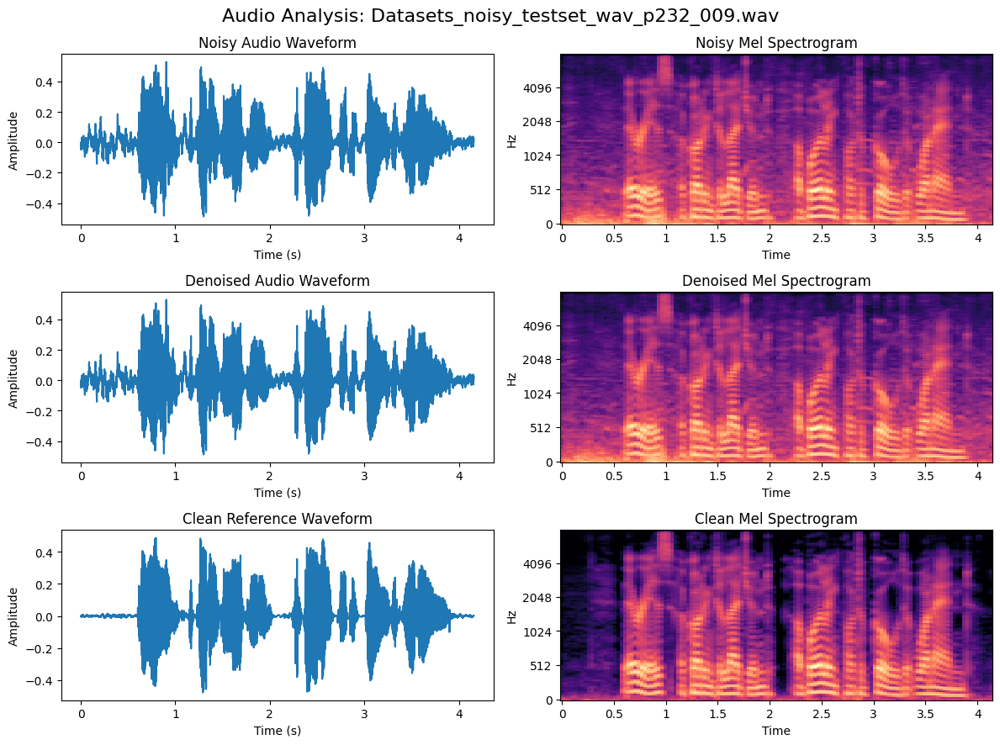

Evaluating files:  38%|███▊      | 3/8 [00:05<00:09,  1.94s/it]


Evaluating file: Datasets_noisy_testset_wav_p232_010.wav
--------------------------------------------------

Denoised Audio Metrics:
PESQ      : 1.2069
STOI      : 0.7856
SNR       : 1.0648
SDR       : 1.0648

Noisy Audio Metrics:
PESQ      : 1.2069
STOI      : 0.7856
SNR       : 1.0648
SDR       : 1.0648

Improvement Metrics:
PESQ Improvement    : +0.0000
STOI Improvement    : +0.0000
SNR Improvement     : +0.0000
SDR Improvement     : +0.0000


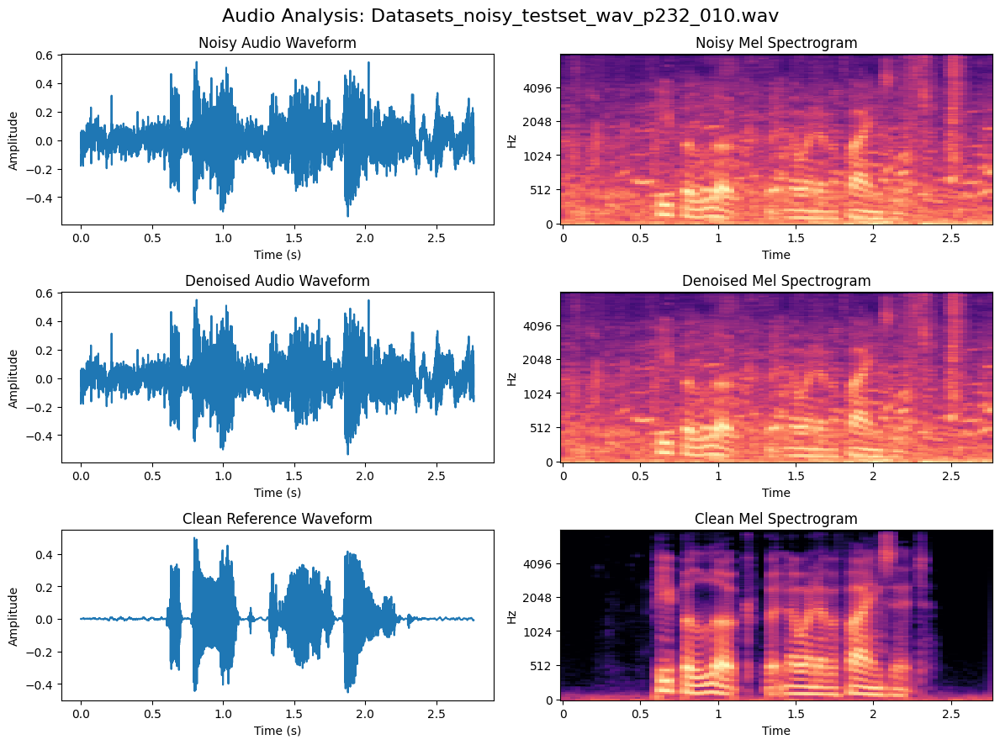

Evaluating files:  50%|█████     | 4/8 [00:07<00:07,  1.77s/it]


Evaluating file: Datasets_noisy_testset_wav_p232_001.wav
--------------------------------------------------

Denoised Audio Metrics:
PESQ      : 2.8937
STOI      : 0.9023
SNR       : 16.5098
SDR       : 16.5098

Noisy Audio Metrics:
PESQ      : 2.8937
STOI      : 0.9023
SNR       : 16.5098
SDR       : 16.5098

Improvement Metrics:
PESQ Improvement    : +0.0000
STOI Improvement    : +0.0000
SNR Improvement     : +0.0000
SDR Improvement     : +0.0000


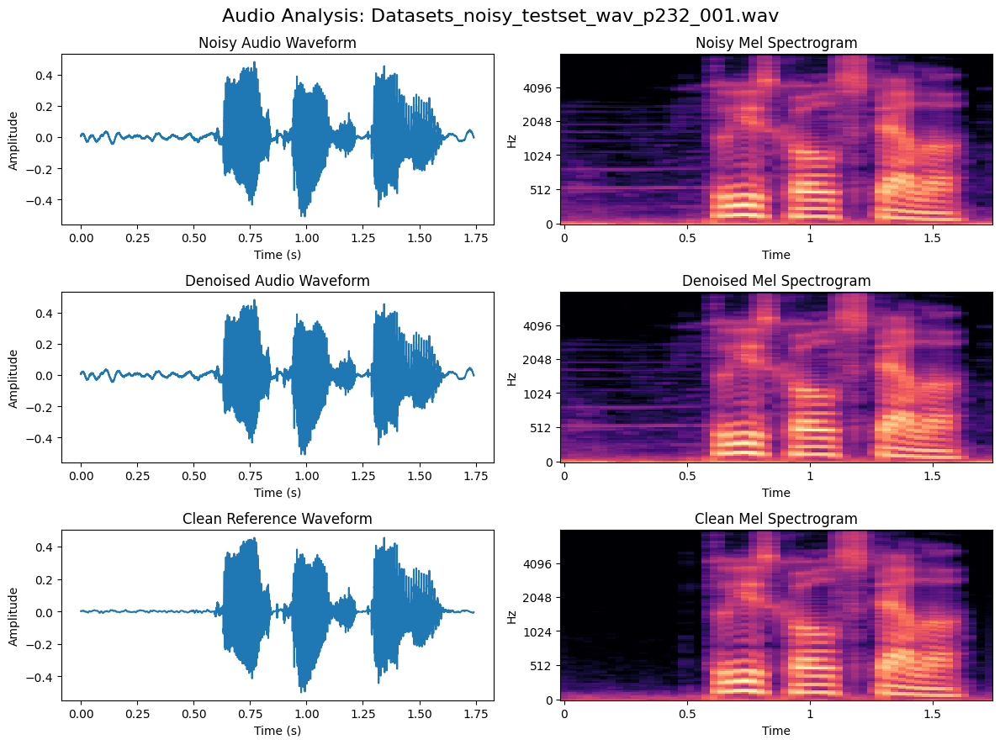

Evaluating files:  62%|██████▎   | 5/8 [00:08<00:04,  1.63s/it]


Evaluating file: Datasets_noisy_testset_wav_p232_003.wav
--------------------------------------------------

Denoised Audio Metrics:
PESQ      : 2.7605
STOI      : 0.9729
SNR       : 9.8502
SDR       : 9.8502

Noisy Audio Metrics:
PESQ      : 2.7605
STOI      : 0.9729
SNR       : 9.8502
SDR       : 9.8502

Improvement Metrics:
PESQ Improvement    : +0.0000
STOI Improvement    : +0.0000
SNR Improvement     : +0.0000
SDR Improvement     : +0.0000


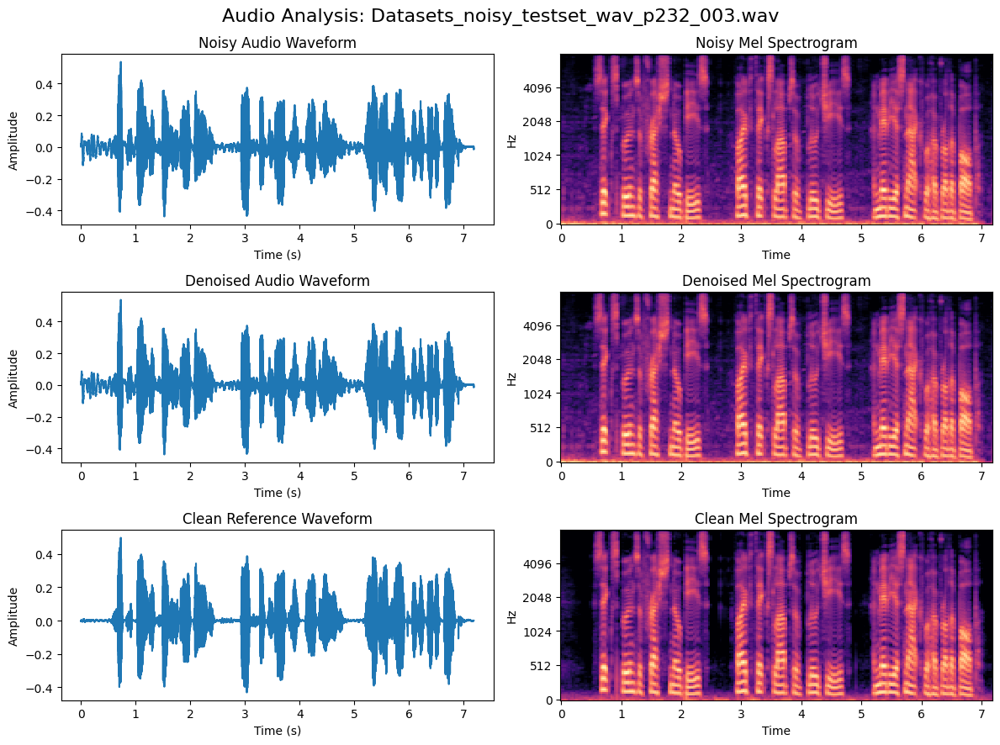

Evaluating files:  75%|███████▌  | 6/8 [00:10<00:03,  1.79s/it]


Evaluating file: Datasets_noisy_testset_wav_p232_002.wav
--------------------------------------------------

Denoised Audio Metrics:
PESQ      : 3.0461
STOI      : 0.9679
SNR       : 12.0342
SDR       : 12.0342

Noisy Audio Metrics:
PESQ      : 3.0461
STOI      : 0.9679
SNR       : 12.0342
SDR       : 12.0342

Improvement Metrics:
PESQ Improvement    : +0.0000
STOI Improvement    : +0.0000
SNR Improvement     : +0.0000
SDR Improvement     : +0.0000


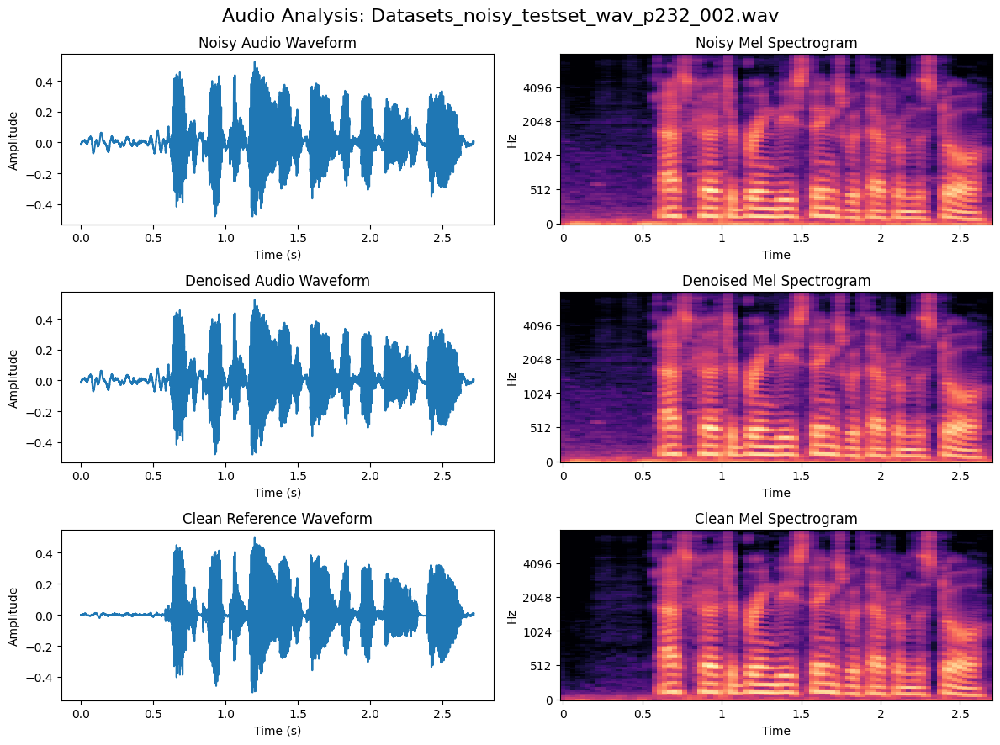

Evaluating files:  88%|████████▊ | 7/8 [00:12<00:01,  1.72s/it]


Evaluating file: Datasets_noisy_testset_wav_p232_005.wav
--------------------------------------------------

Denoised Audio Metrics:
PESQ      : 1.3370
STOI      : 0.8805
SNR       : 3.0709
SDR       : 3.0709

Noisy Audio Metrics:
PESQ      : 1.3370
STOI      : 0.8805
SNR       : 3.0709
SDR       : 3.0709

Improvement Metrics:
PESQ Improvement    : +0.0000
STOI Improvement    : +0.0000
SNR Improvement     : +0.0000
SDR Improvement     : +0.0000


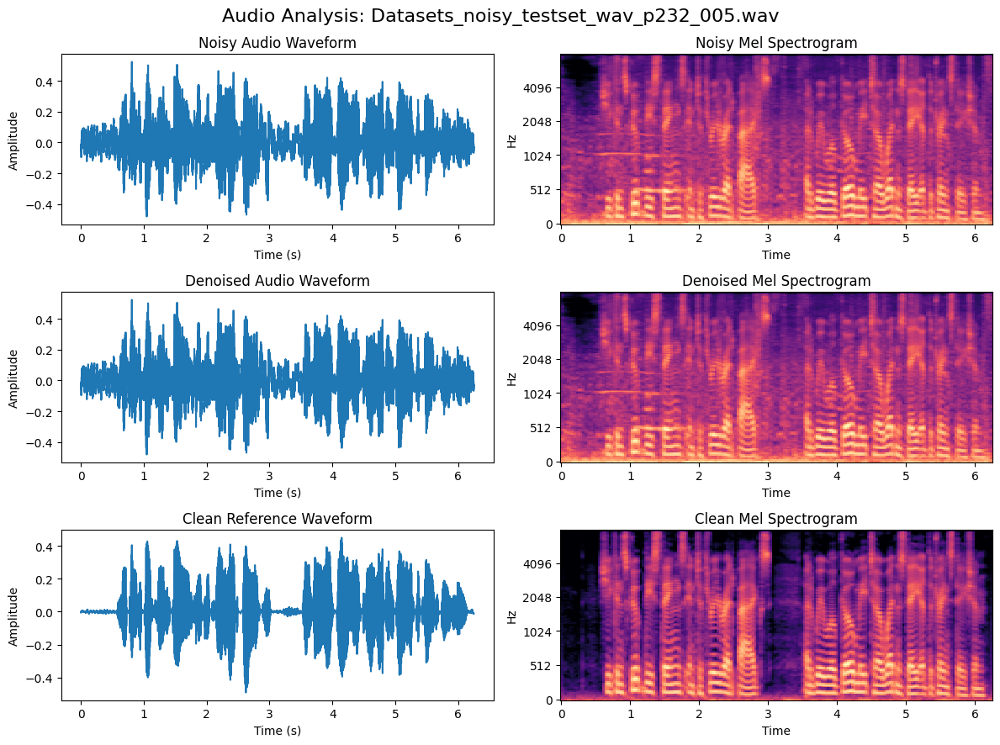

Evaluating files: 100%|██████████| 8/8 [00:14<00:00,  1.80s/it]
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


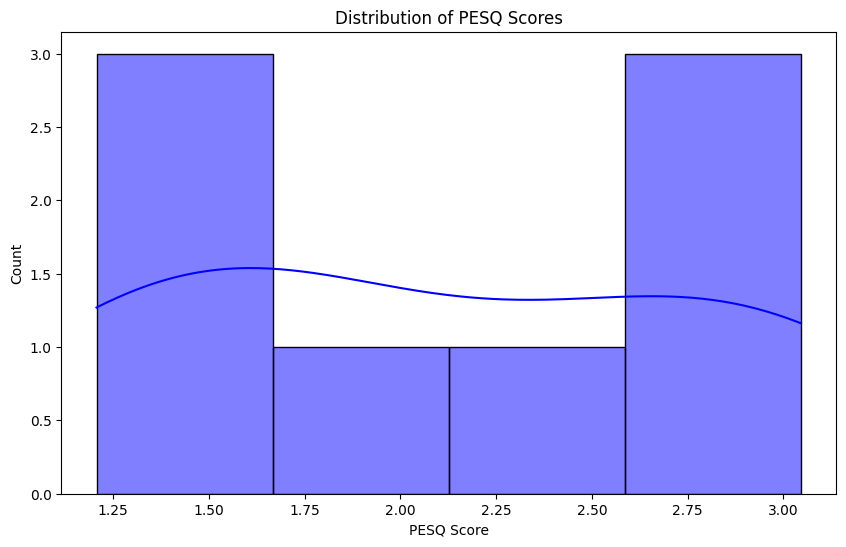

Summary report saved to evaluation_results_paired/evaluation_report.md

--- Running Unpaired Evaluation (Set 2) ---


/usr/local/lib/python3.11/dist-packages/whisper/__init__.py:150: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(fp, map_location=device)


Loaded Whisper model: base
Found 4 matching file pairs


Evaluating files:   0%|          | 0/4 [00:00<?, ?it/s]

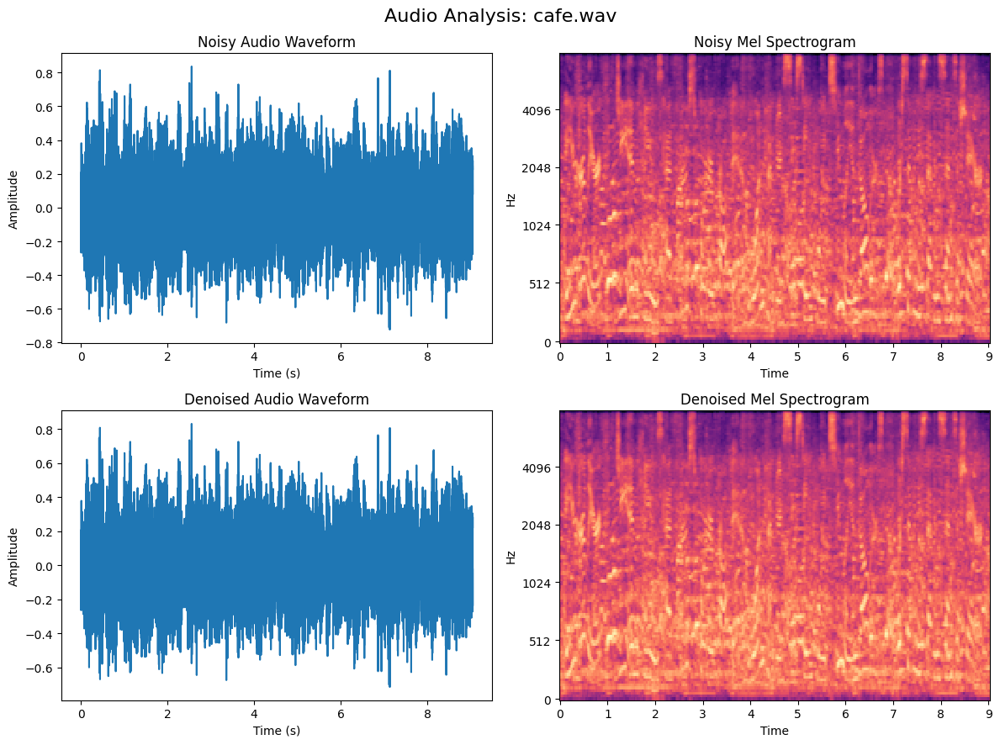

Evaluating files:  25%|██▌       | 1/4 [00:01<00:04,  1.58s/it]

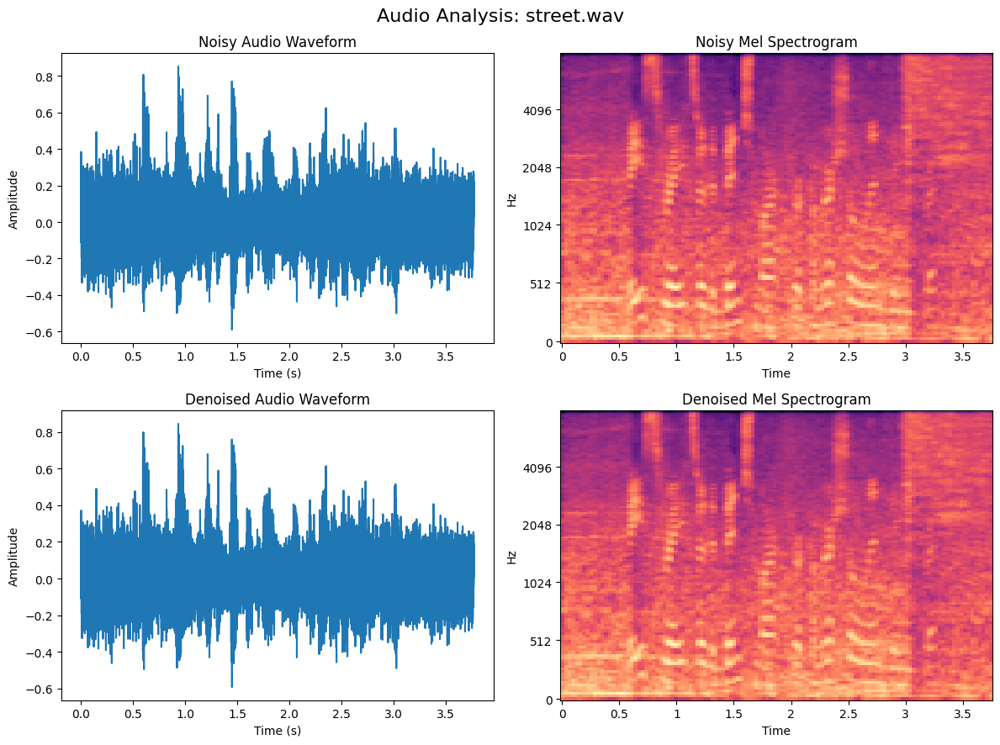

Evaluating files:  50%|█████     | 2/4 [00:02<00:02,  1.36s/it]

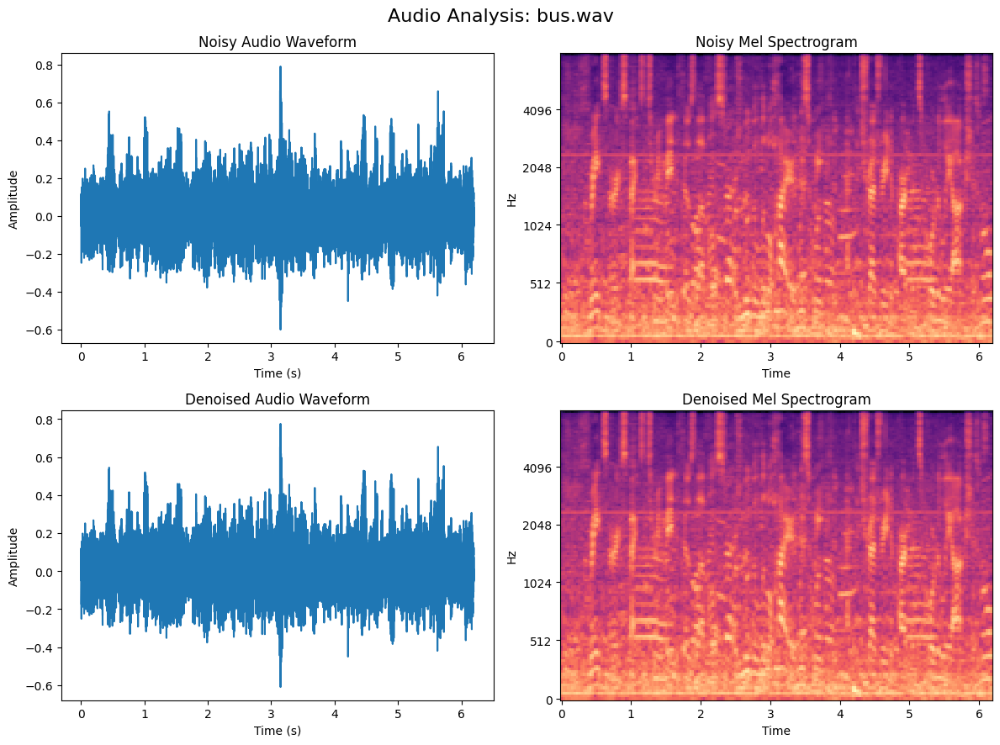

Evaluating files:  75%|███████▌  | 3/4 [00:04<00:01,  1.41s/it]

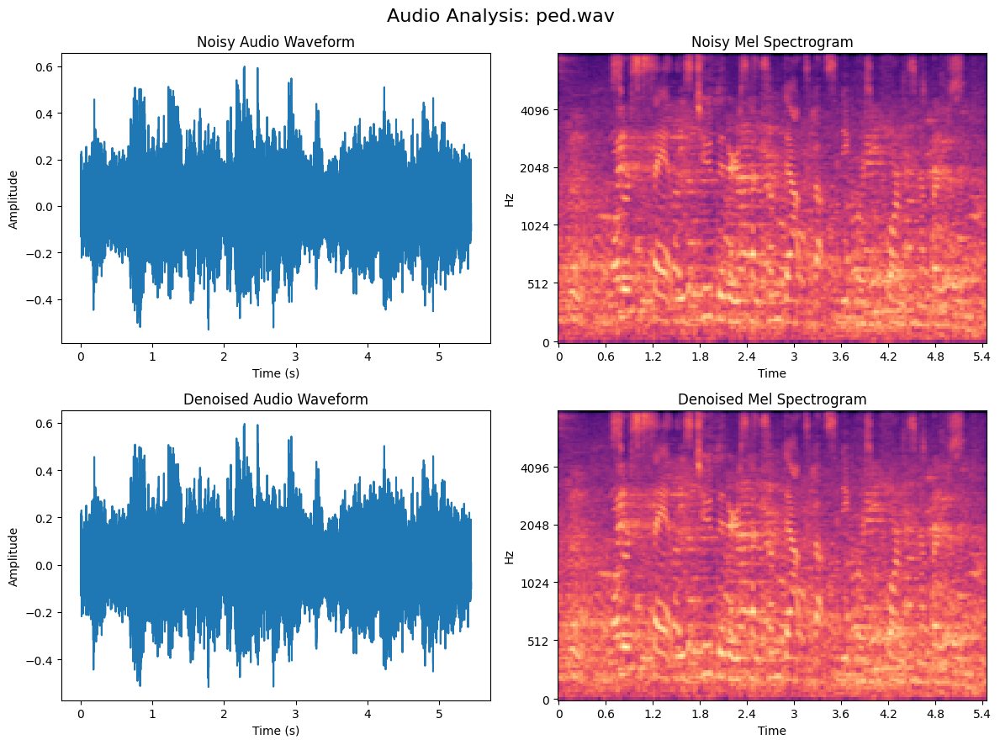

Evaluating files: 100%|██████████| 4/4 [00:05<00:00,  1.49s/it]

Summary report saved to evaluation_results_unpaired/evaluation_report.md

Evaluation complete!
Set 1 (Paired) results saved to evaluation_results_paired
Set 2 (Unpaired) results saved to evaluation_results_unpaired


In [21]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from tqdm import tqdm
import torch
import json
import seaborn as sns
from tabulate import tabulate
import re
from pathlib import Path
import jiwer
from pesq import pesq
from pystoi import stoi

class TranscriptionEvaluator:
    def __init__(self, whisper_model_size="base"):
        
        import whisper
        self.model = whisper.load_model(whisper_model_size)
        print(f"Loaded Whisper model: {whisper_model_size}")
    
    def transcribe_audio(self, audio, sr):
        audio = audio.astype(np.float32)
        
        if np.max(np.abs(audio)) > 1.0:
            audio = audio / np.max(np.abs(audio))
        
        result = self.model.transcribe(audio)
        return result
    
    def calculate_wer(self, reference_text, hypothesis_text):
        return jiwer.wer(reference_text, hypothesis_text)
    
    def calculate_objective_metrics(self, clean, denoised, sr=16000):
        metrics = {}
        
        try:
            # Ensure same length
            min_len = min(len(clean), len(denoised))
            if min_len == 0:
                return metrics
                
            clean = clean[:min_len]
            denoised = denoised[:min_len]
            
            # Calculate PESQ
            try:
                metrics['pesq'] = pesq(sr, clean, denoised, 'wb')
            except Exception as e:
                print(f"PESQ calculation error: {e}")
            
            # Calculate STOI
            try:
                metrics['stoi'] = stoi(clean, denoised, sr, extended=False)
            except Exception as e:
                print(f"STOI calculation error: {e}")
            
            # Calculate SNR
            try:
                noise = denoised - clean
                signal_power = np.sum(clean**2)
                noise_power = np.sum(noise**2)
                if noise_power > 1e-10:  # Avoid division by zero
                    metrics['snr'] = 10 * np.log10(signal_power / noise_power)
            except Exception as e:
                print(f"SNR calculation error: {e}")
            
            # Calculate SDR
            try:
                ratio = np.sum(clean**2) / (np.sum((clean - denoised)**2) + 1e-10)
                metrics['sdr'] = 10 * np.log10(ratio)
            except Exception as e:
                print(f"SDR calculation error: {e}")
                
        except Exception as e:
            print(f"Error in metric calculation: {e}")
        
        return metrics
        
    def visualize_denoising_results(self, noisy, denoised, clean=None, sr=16000, title="Audio Analysis", output_path=None):
        
        min_len = min(len(noisy), len(denoised))
        if clean is not None:
            min_len = min(min_len, len(clean))
        
        noisy = noisy[:min_len]
        denoised = denoised[:min_len]
        if clean is not None:
            clean = clean[:min_len]
        
        # Calculate time axis
        time = np.arange(min_len) / sr
        
        # Create figure
        fig, axes = plt.subplots(3 if clean is not None else 2, 2, figsize=(12, 9))
        fig.suptitle(title, fontsize=16)
        
        # Plot waveforms on left column
        axes[0, 0].plot(time, noisy)
        axes[0, 0].set_title("Noisy Audio Waveform")
        axes[0, 0].set_xlabel("Time (s)")
        axes[0, 0].set_ylabel("Amplitude")
        
        axes[1, 0].plot(time, denoised)
        axes[1, 0].set_title("Denoised Audio Waveform")
        axes[1, 0].set_xlabel("Time (s)")
        axes[1, 0].set_ylabel("Amplitude")
        
        if clean is not None:
            axes[2, 0].plot(time, clean)
            axes[2, 0].set_title("Clean Reference Waveform")
            axes[2, 0].set_xlabel("Time (s)")
            axes[2, 0].set_ylabel("Amplitude")
        
        # Plot spectrograms on right column
        S_noisy = librosa.feature.melspectrogram(y=noisy, sr=sr)
        S_denoised = librosa.feature.melspectrogram(y=denoised, sr=sr)
        
        librosa.display.specshow(librosa.power_to_db(S_noisy, ref=np.max), 
                                y_axis='mel', x_axis='time', sr=sr, ax=axes[0, 1])
        axes[0, 1].set_title("Noisy Mel Spectrogram")
        
        librosa.display.specshow(librosa.power_to_db(S_denoised, ref=np.max), 
                                y_axis='mel', x_axis='time', sr=sr, ax=axes[1, 1])
        axes[1, 1].set_title("Denoised Mel Spectrogram")
        
        if clean is not None:
            S_clean = librosa.feature.melspectrogram(y=clean, sr=sr)
            librosa.display.specshow(librosa.power_to_db(S_clean, ref=np.max), 
                                    y_axis='mel', x_axis='time', sr=sr, ax=axes[2, 1])
            axes[2, 1].set_title("Clean Mel Spectrogram")
        
        plt.tight_layout()
        
        # Save figure if output path is provided
        if output_path:
            plt.show()
            plt.savefig(output_path, dpi=300, bbox_inches='tight')
            plt.close()
        else:
            plt.show()
    
    def visualize_transcription_comparison(self, reference_text, transcripts, title="Transcription Analysis", output_path=None):
        # Create figure
        plt.figure(figsize=(10, 6))
        plt.title(title, fontsize=16)
        
        # Calculate WER for each transcript
        wer_scores = {}
        for name, text in transcripts.items():
            wer_scores[name] = self.calculate_wer(reference_text, text)
        
        # Plot WER scores
        plt.bar(wer_scores.keys(), wer_scores.values(), color=['red', 'blue'])
        plt.ylabel('Word Error Rate (lower is better)')
        plt.ylim(0, max(1.0, max(wer_scores.values()) * 1.2))
        
        # Add values on top of bars
        for i, (name, value) in enumerate(wer_scores.items()):
            plt.text(i, value + 0.05, f"{value:.3f}", ha='center')
        
        plt.tight_layout()
        
        # Save figure if output path is provided
        if output_path:
            plt.show()
            plt.savefig(output_path, dpi=300, bbox_inches='tight')
            plt.close()
        else:
            plt.show()

def find_matching_files(denoised_dir, reference_dir, pattern_type="paired"):
    matches = []
    
    denoised_files = list(Path(denoised_dir).rglob("*.wav"))
    reference_files = list(Path(reference_dir).rglob("*.wav"))
    
    # Convert reference files to dictionary for faster lookup
    ref_dict = {}
    
    for ref_path in reference_files:
        basename = ref_path.name
        
        # For unpaired files, remove the directory prefix
        if pattern_type == "unpaired":
            # Remove directory prefix for better matching
            basename = basename
            ref_dict[basename] = ref_path
        else:  # paired files
            # Extract the identifier part
            clean_name = basename
            ref_dict[clean_name] = ref_path
    
    # Find matches
    for denoised_path in denoised_files:
        basename = denoised_path.name
        
        if pattern_type == "unpaired":
            # For unpaired, remove "denoised_" prefix if present
            if basename.startswith("denoised_"):
                original_name = basename[len("denoised_"):]
                if original_name in ref_dict:
                    matches.append((denoised_path, ref_dict[original_name], original_name))
        else:  # paired files
            # For paired, extract the identifier from the denoised file name
            if "denoised_" in basename:
                # Extract the part after "denoised_"
                original_name = basename[basename.find("denoised_") + len("denoised_"):]
                
                # Look for matching file in reference directory
                for clean_name, ref_path in ref_dict.items():
                    # Match by identifier in the filename
                    if original_name.replace("Datasets_noisy_testset_wav_", "") in clean_name:
                        matches.append((denoised_path, ref_path, original_name))
                        break
    
    return matches

def evaluate_denoised_audio(denoised_dir, reference_dir=None, reference_transcripts_file=None, output_dir='results', pattern_type="paired"):
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'visualizations'), exist_ok=True)
    
    # Initialize the evaluator
    evaluator = TranscriptionEvaluator(whisper_model_size="base")
    
    # Load reference transcripts if available
    reference_transcripts = {}
    if reference_transcripts_file and os.path.exists(reference_transcripts_file):
        with open(reference_transcripts_file, 'r') as f:
            reference_transcripts = json.load(f)
    
    # Find matching files
    matched_files = find_matching_files(denoised_dir, reference_dir, pattern_type)
    print(f"Found {len(matched_files)} matching file pairs")
    
    # Prepare results storage
    results = []
    
  
    for denoised_path, reference_path, base_filename in tqdm(matched_files, desc="Evaluating files"):
        denoised, sr_denoised = librosa.load(denoised_path, sr=16000)
        reference, sr_reference = librosa.load(reference_path, sr=16000)
        
        file_metrics = {
            'filename': base_filename,
            'duration': len(denoised) / sr_denoised
        }
        
        clean = None
        noisy = None
        sr_noisy = None
        
        if pattern_type == "paired":
            clean = reference
            noisy = None
            
            # Try to find corresponding noisy file in the denoised directory
            noisy_path = None
            for candidate in Path(denoised_dir).parent.rglob(f"*{base_filename}*"):
                if "noisy" in str(candidate) and candidate.suffix == ".wav":
                    noisy_path = candidate
                    break
            
            if noisy_path:
                noisy, sr_noisy = librosa.load(noisy_path, sr=16000)
        else:  # unpaired
            noisy = reference
            sr_noisy = sr_reference
            clean = None
        
        objective_metrics = {}
        if clean is not None:
            print(f"\nEvaluating file: {base_filename}")
            print("-"*50)
            
            objective_metrics = evaluator.calculate_objective_metrics(clean, denoised, sr=16000) or {}
            
            # Print denoised metrics
            print("\nDenoised Audio Metrics:")
            for metric, value in objective_metrics.items():
                if not metric.endswith('_improvement'):
                    print(f"{metric.upper():<10}: {value:.4f}")
            
            if noisy is not None:
                noisy_metrics = evaluator.calculate_objective_metrics(clean, noisy, sr=16000) or {}
                
                # Print noisy metrics
                print("\nNoisy Audio Metrics:")
                for metric, value in noisy_metrics.items():
                    print(f"{metric.upper():<10}: {value:.4f}")
                
                # Add and print improvement metrics
                print("\nImprovement Metrics:")
                for metric in ['pesq', 'stoi', 'snr', 'sdr']:
                    if metric in noisy_metrics and metric in objective_metrics:
                        improvement = objective_metrics[metric] - noisy_metrics[metric]
                        objective_metrics[f'{metric}_improvement'] = improvement
                        print(f"{metric.upper() + ' Improvement':<20}: {improvement:+.4f}")
        
        denoised_transcription = evaluator.transcribe_audio(denoised, sr_denoised)
        
        transcription_metrics = {}
        
        if noisy is not None:
            noisy_transcription = evaluator.transcribe_audio(noisy, sr_noisy)
        else:
            noisy_transcription = {'text': ''}
        
        reference_text = reference_transcripts.get(base_filename, '')
        
        if reference_text:
            # Calculate WER for both noisy and denoised
            noisy_wer = evaluator.calculate_wer(reference_text, noisy_transcription['text'])
            denoised_wer = evaluator.calculate_wer(reference_text, denoised_transcription['text'])
            
            transcription_metrics = {
                'noisy_wer': noisy_wer,
                'denoised_wer': denoised_wer,
                'wer_improvement': noisy_wer - denoised_wer
            }
        
        vis_path = os.path.join(output_dir, 'visualizations', f"{Path(base_filename).stem}_visual.png")
        
        evaluator.visualize_denoising_results(
            noisy=noisy if noisy is not None else np.zeros_like(denoised),
            denoised=denoised, 
            clean=clean if pattern_type == "paired" else None,
            sr=sr_denoised, 
            title=f"Audio Analysis: {base_filename}",
            output_path=vis_path
        )
        
        if reference_text:
            trans_vis_path = os.path.join(output_dir, 'visualizations', f"{Path(base_filename).stem}_transcript.png")
            
            evaluator.visualize_transcription_comparison(
                reference_text=reference_text,
                transcripts={
                    'noisy': noisy_transcription['text'],
                    'denoised': denoised_transcription['text']
                },
                title=f"Transcription Analysis: {base_filename}",
                output_path=trans_vis_path
            )
        
        transcript_data = {
            'noisy': noisy_transcription['text'],
            'denoised': denoised_transcription['text'],
            'reference': reference_text
        }
        
        result = {
            **file_metrics,
            **objective_metrics,
            **transcription_metrics,
            'transcripts': transcript_data
        }
        
        results.append(result)
        
        with open(os.path.join(output_dir, f"{Path(base_filename).stem}_results.json"), 'w') as f:
            json.dump(result, f, indent=2)
    
    df = pd.DataFrame(results)
    
    if not df.empty:
        df_to_save = df.copy()
        if 'transcripts' in df_to_save.columns:
            df_to_save = df_to_save.drop('transcripts', axis=1)
        df_to_save.to_csv(os.path.join(output_dir, 'all_results.csv'), index=False)
    
    generate_summary_report(df, output_dir)
    
    return df

def generate_summary_report(results_df, output_dir):
   
    if results_df.empty:
        print("No results to generate report")
        return
    
    report = []
    report.append("# Audio Denoising and Transcription Evaluation Report")
    report.append("\n## Overview")
    report.append(f"- Total files evaluated: {len(results_df)}")
    report.append(f"- Average file duration: {results_df['duration'].mean():.2f} seconds")
    
    # Audio quality metrics
    report.append("\n## Audio Quality Metrics")
    
    audio_metrics = ['pesq', 'stoi', 'snr', 'sdr']
    if all(metric in results_df.columns for metric in audio_metrics):
        report.append("\n### Objective Metrics (Average)")
        
        metrics_table = []
        metrics_table.append(["Metric", "Average Value", "Standard Deviation", "Min", "Max"])
        
        for metric in audio_metrics:
            metrics_table.append([
                metric.upper(),
                f"{results_df[metric].mean():.3f}",
                f"{results_df[metric].std():.3f}",
                f"{results_df[metric].min():.3f}",
                f"{results_df[metric].max():.3f}"
            ])
        
        report.append(tabulate(metrics_table, headers="firstrow", tablefmt="pipe"))
        
        # Add improvement metrics
        improvement_metrics = ['pesq_improvement', 'stoi_improvement', 'snr_improvement', 'sdr_improvement']
        if all(metric in results_df.columns for metric in improvement_metrics):
            report.append("\n### Improvement from Noisy to Denoised (Average)")
            
            improvement_table = []
            improvement_table.append(["Metric", "Average Improvement", "% Improved"])
            
            for metric in ['pesq', 'stoi', 'snr', 'sdr']:
                imp_col = f"{metric}_improvement"
                if imp_col in results_df.columns:
                    percent_improved = (results_df[imp_col] > 0).mean() * 100
                    improvement_table.append([
                        metric.upper(),
                        f"{results_df[imp_col].mean():.3f}",
                        f"{percent_improved:.1f}%"
                    ])
            
            report.append(tabulate(improvement_table, headers="firstrow", tablefmt="pipe"))
    
    # Transcription metrics
    transcription_metrics = ['noisy_wer', 'denoised_wer', 'wer_improvement']
    if all(metric in results_df.columns for metric in transcription_metrics):
        report.append("\n## Transcription Accuracy")
        
        trans_table = []
        trans_table.append(["Metric", "Average Value", "Standard Deviation", "Min", "Max"])
        
        for metric in ['noisy_wer', 'denoised_wer']:
            trans_table.append([
                "WER" + (" (Noisy)" if "noisy" in metric else " (Denoised)"),
                f"{results_df[metric].mean():.3f}",
                f"{results_df[metric].std():.3f}",
                f"{results_df[metric].min():.3f}",
                f"{results_df[metric].max():.3f}"
            ])
        
        report.append(tabulate(trans_table, headers="firstrow", tablefmt="pipe"))
        
        # WER improvement
        wer_improved = (results_df['wer_improvement'] > 0).mean() * 100
        report.append(f"\n- WER improvement: {results_df['wer_improvement'].mean():.3f}")
        report.append(f"- Files with improved transcription accuracy: {wer_improved:.1f}%")
    
    # Generate visualizations for the report
    if len(results_df) > 0:
        report.append("\n## Summary Visualizations")
        
        # Create plots directory
        plots_dir = os.path.join(output_dir, 'summary_plots')
        os.makedirs(plots_dir, exist_ok=True)
        
        # Plot distributions if metrics exist
        if all(metric in results_df.columns for metric in audio_metrics):
            # PESQ comparison
            plt.figure(figsize=(10, 6))
            sns.histplot(results_df['pesq'], kde=True, color='blue')
            plt.title('Distribution of PESQ Scores')
            plt.xlabel('PESQ Score')
            plt.ylabel('Count')
            plt.show()
            plt.savefig(os.path.join(plots_dir, 'pesq_distribution.png'), dpi=300, bbox_inches='tight')
            plt.close()
            
            report.append("\n![PESQ Distribution](summary_plots/pesq_distribution.png)")
            
            # Metrics comparison
            if 'pesq_improvement' in results_df.columns:
                plt.figure(figsize=(12, 8))
                metrics_to_plot = ['pesq_improvement', 'stoi_improvement', 'snr_improvement', 'sdr_improvement']
                data_to_plot = results_df[metrics_to_plot].mean().values
                plt.bar(range(len(metrics_to_plot)), data_to_plot, color='green')
                plt.xticks(range(len(metrics_to_plot)), [m.replace('_improvement', '') for m in metrics_to_plot])
                plt.title('Average Improvement in Audio Quality Metrics')
                plt.ylabel('Improvement')
                plt.grid(axis='y', alpha=0.3)
                
                # Add values on top of bars
                for i, v in enumerate(data_to_plot):
                    plt.text(i, v + 0.01, f"{v:.3f}", ha='center')
                
                plt.savefig(os.path.join(plots_dir, 'metrics_improvement.png'), dpi=300, bbox_inches='tight')
                plt.close()
                
                report.append("\n![Metrics Improvement](summary_plots/metrics_improvement.png)")
        
        if 'noisy_wer' in results_df.columns and 'denoised_wer' in results_df.columns:
            plt.figure(figsize=(10, 6))
            
            wer_data = [results_df['noisy_wer'].mean(), results_df['denoised_wer'].mean()]
            plt.bar(['Noisy', 'Denoised'], wer_data, color=['red', 'blue'])
            plt.title('Average Word Error Rate (WER)')
            plt.ylabel('WER (lower is better)')
            plt.grid(axis='y', alpha=0.3)
            
            # Add values on top of bars
            for i, v in enumerate(wer_data):
                plt.text(i, v + 0.01, f"{v:.3f}", ha='center')
            plt.show()
            plt.savefig(os.path.join(plots_dir, 'wer_comparison.png'), dpi=300, bbox_inches='tight')
            plt.close()
            
            report.append("\n![WER Comparison](summary_plots/wer_comparison.png)")
    
    # Save the report
    with open(os.path.join(output_dir, 'evaluation_report.md'), 'w') as f:
        f.write('\n'.join(report))
    
    print(f"Summary report saved to {os.path.join(output_dir, 'evaluation_report.md')}")

def load_transcripts_from_txt(transcript_dir):
    transcripts = {}
    txt_files = list(Path(transcript_dir).rglob("*.txt"))
    
    for txt_file in txt_files:
        try:
            with open(txt_file, 'r') as f:
                content = f.read().strip()
            
            # Use base filename without extension as key
            base_name = txt_file.stem
            
            # If txt file has the same name as a wav file, use that
            transcripts[f"{base_name}.wav"] = content
        except Exception as e:
            print(f"Error loading transcript {txt_file}: {e}")
    
    return transcripts

def main():
    # Configure paths for paired evaluation (Set 1)
    paired_clean_dir = "/kaggle/input/speechmajorques2/set 1 - Clean and noisy-20250419T093119Z-001/set 1 - Clean and noisy/clean"
    paired_denoised_dir = "/kaggle/input/speechmajorques2/Denoised_paired/Denoised_paired"
    paired_output_dir = "evaluation_results_paired"
    
    # Configure paths for unpaired evaluation (Set 2)
    unpaired_noisy_dir = "/kaggle/input/speechmajorques2/set 2 - only noisy-20250419T093119Z-001/set 2 - only noisy"
    unpaired_denoised_dir = "/kaggle/input/speechmajorques2/Denoised_Unpaired/Denoised_Unpaired"
    unpaired_output_dir = "evaluation_results_unpaired"
    
    # Create output directories
    os.makedirs(paired_output_dir, exist_ok=True)
    os.makedirs(unpaired_output_dir, exist_ok=True)
    
    # Since reference text files are no longer available, we'll proceed without them
    paired_transcripts_file = None
    unpaired_transcripts_file = None
    
    # Run evaluations
    print("\n--- Running Paired Evaluation (Set 1) ---")
    paired_results = evaluate_denoised_audio(
        denoised_dir=paired_denoised_dir,
        reference_dir=paired_clean_dir,
        reference_transcripts_file=None,  
        output_dir=paired_output_dir,
        pattern_type="paired"
    )
    
    print("\n--- Running Unpaired Evaluation (Set 2) ---")
    unpaired_results = evaluate_denoised_audio(
        denoised_dir=unpaired_denoised_dir,
        reference_dir=unpaired_noisy_dir,
        reference_transcripts_file=None,  
        output_dir=unpaired_output_dir,
        pattern_type="unpaired"
    )
    
    print("\nEvaluation complete!")
    print(f"Set 1 (Paired) results saved to {paired_output_dir}")
    print(f"Set 2 (Unpaired) results saved to {unpaired_output_dir}")

if __name__ == "__main__":
    main()